In [1]:
SEED = 42
QUANTILE = 0.99
MAX_SAMPLES = 10000
AI_RATIOS = [0.5, 0.1, 0.01]

ENCODERS = [
    "all-MiniLM-L6-v2",  # baseline
    "all-mpnet-base-v2",  # strong semantics
    "intfloat/e5-base",  # contrastive geometry
]

MAX_VIS_SAMPLES = 2000

In [2]:
def get_embeddings(encoder, df, show_progress_bar=False):
    result = []
    for text in tqdm(df.tolist()):
        sentences = nltk.sent_tokenize(text)
        embeddings = encoder.encode(
            sentences,
            batch_size=64,
            show_progress_bar=show_progress_bar,
        )
        result.append(np.mean(embeddings, axis=0))

    return np.vstack(result)

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sentence_transformers import SentenceTransformer
from sklearn.model_selection import train_test_split
from sklearn.covariance import LedoitWolf
from sklearn.metrics import roc_auc_score, average_precision_score, f1_score, roc_curve, precision_recall_curve
from sklearn.decomposition import PCA
from scipy.special import softmax
from random import sample
from tqdm import tqdm
from collections import defaultdict

import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /Users/artfultom/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [4]:
sns.set(style="whitegrid")

def subsample(X_h, X_ai, max_samples):
    idx_h = list(range(len(X_h)))
    idx_ai = list(range(len(X_ai)))

    if len(idx_h) > max_samples // 2:
        idx_h = sample(idx_h, max_samples // 2)
    if len(idx_ai) > max_samples // 2:
        idx_ai = sample(idx_ai, max_samples // 2)

    X = np.vstack([X_h[idx_h], X_ai[idx_ai]])
    y = np.concatenate([np.zeros(len(idx_h)), np.ones(len(idx_ai))])

    return X, y


def plot_mahalanobis_distributions(scores_human, scores_ai, threshold, name):
    plt.figure(figsize=(8, 5))

    all_scores = np.concatenate([scores_human, scores_ai])
    bins = np.histogram_bin_edges(all_scores, bins="auto")

    plt.hist(scores_human, bins=bins, density=True, alpha=0.6, label="Человек")
    plt.hist(scores_ai, bins=bins, density=True, alpha=0.6, label="ИИ")

    plt.axvline(threshold, color="red", linestyle="--", linewidth=2, label=f"пороговое значение")

    plt.title(f"Распределение расстояния Махаланобиса (dataset '{name}')")
    plt.xlabel("Квадрат расстояния Махаланобиса")
    plt.ylabel("Плотность")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()

    plt.show()


def plot_roc_curve(y_true, scores, roc_auc, name):
    fpr, tpr, _ = roc_curve(y_true, scores)

    plt.figure(figsize=(8, 5))
    plt.plot(fpr, tpr, label=f"ROC AUC = {roc_auc:.4f}")
    plt.plot([0, 1], [0, 1], "k--", alpha=0.5)
    plt.xlabel("False Positive Rate (FPR)")
    plt.ylabel("True Positive Rate TPR")
    plt.title(f"ROC-кривая ('{name}')")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()

    plt.show()


def plot_pr_curve(y_true, scores, auprc, name):
    precision, recall, _ = precision_recall_curve(y_true, scores)

    plt.figure(figsize=(8, 5))
    plt.plot(recall, precision, label=f"AUPRC = {auprc:.4f}")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title(f"Precision-Recall кривая ('{name}')")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()

    plt.show()


def plot_pca_projection(X_human, X_ai, name):
    X, y = subsample(X_human, X_ai, MAX_VIS_SAMPLES)
    X_2d = PCA(n_components=2, random_state=SEED).fit_transform(X)

    plt.figure(figsize=(8, 5))
    scatter = sns.scatterplot(
        x=X_2d[:, 0], y=X_2d[:, 1],
        hue=y, palette={0: "blue", 1: "orange"},
        alpha=0.5, s=35
    )
    plt.title(f"Проекция PCA (dataset '{name}')")

    handles, _ = scatter.get_legend_handles_labels()
    plt.legend(handles=handles, labels=["Человек", "ИИ"])
    plt.tight_layout()

    plt.show()


def print_header(title, char="="):
    print(f"\n{char * 100}")
    print(title)
    print(f"{char * 100}")


def print_subheader(title):
    print(f"\n--- {title} ---")


def print_kv(key, value, width=35):
    print(f"{key:<{width}}: {value}")


def make_test_dataset(X_ai, human_df, ai_ratio, max_samples, seed):
    ai_target = int(max_samples * ai_ratio)
    human_target = max_samples - ai_target

    ai_n = min(ai_target, len(X_ai))
    human_n = min(human_target, len(human_df))

    total = ai_n + human_n
    if total < max_samples:
        if ai_n < ai_target:
            human_n = min(len(human_df), max_samples - ai_n)
        else:
            ai_n = min(len(X_ai), max_samples - human_n)

    ai_sample = X_ai.sample(n=ai_n, random_state=seed)
    human_sample = human_df.sample(n=human_n, random_state=seed)

    return ai_sample, human_sample

In [5]:
human_df = (
    pd.read_csv("../datasets/human_essays.csv", encoding="utf-8")
    .assign(label=0)[["text", "label"]]
    .reset_index(drop=True)
)

print(f"Живых текстов: {len(human_df)}")

Живых текстов: 127865


In [6]:
filenames = {
    "Mistral 7B": [
        "../datasets/mistral_essays_1.csv",
        "../datasets/mistral_essays_2.csv",
        "../datasets/mistral_essays_3.csv",
        "../datasets/mistral_essays_4.csv",
        "../datasets/mistral_essays_5.csv",
    ],
    "Llama 3 13B": [
        "../datasets/llama_essays_1.csv",
        "../datasets/llama_essays_2.csv",
        "../datasets/llama_essays_3.csv",
        "../datasets/llama_essays_4.csv",
        "../datasets/llama_essays_5.csv",
    ],
    "DeepSeek V3.2": [
        "../datasets/deepseek_essays_1.csv",
        "../datasets/deepseek_essays_2.csv",
        "../datasets/deepseek_essays_3.csv",
        "../datasets/deepseek_essays_4.csv",
        "../datasets/deepseek_essays_5.csv",
    ],
    "ChatGPT": [
        "../datasets/chatgpt_essays_1.csv",
        "../datasets/chatgpt_essays_2.csv",
        "../datasets/chatgpt_essays_3.csv",
        "../datasets/chatgpt_essays_4.csv",
        "../datasets/chatgpt_essays_5.csv",
    ]
}

ai_datasets = defaultdict(pd.DataFrame)
for name, files in filenames.items():
    for file in files:
        df = pd.read_csv(file, encoding="utf-8").assign(label=1)[["text", "label"]].reset_index(drop=True)
        ai_datasets[name] = pd.concat([ai_datasets[name], df], ignore_index=True)
        print(f"Загружен '{file}', {len(df)} записей.")

print_header("Данные")
for name, data in ai_datasets.items():
    print(f"Набор '{name}':\t{len(data)} записей")

Загружен '../datasets/mistral_essays_1.csv', 1500 записей.
Загружен '../datasets/mistral_essays_2.csv', 1500 записей.
Загружен '../datasets/mistral_essays_3.csv', 1500 записей.
Загружен '../datasets/mistral_essays_4.csv', 1500 записей.
Загружен '../datasets/mistral_essays_5.csv', 1500 записей.
Загружен '../datasets/llama_essays_1.csv', 999 записей.
Загружен '../datasets/llama_essays_2.csv', 1000 записей.
Загружен '../datasets/llama_essays_3.csv', 994 записей.
Загружен '../datasets/llama_essays_4.csv', 997 записей.
Загружен '../datasets/llama_essays_5.csv', 999 записей.
Загружен '../datasets/deepseek_essays_1.csv', 3000 записей.
Загружен '../datasets/deepseek_essays_2.csv', 3000 записей.
Загружен '../datasets/deepseek_essays_3.csv', 2999 записей.
Загружен '../datasets/deepseek_essays_4.csv', 3000 записей.
Загружен '../datasets/deepseek_essays_5.csv', 3000 записей.
Загружен '../datasets/chatgpt_essays_1.csv', 2000 записей.
Загружен '../datasets/chatgpt_essays_2.csv', 2000 записей.
Загруж

100%|█████████████████████████████████████| 10000/10000 [10:10<00:00, 16.39it/s]


Пороговое значение (q=0.99)        : 1001.1560

Эмбеддер: all-MiniLM-L6-v2
Доля синтетических текстов: 50.0%

Dataset: Mistral 7B
----------------------------------------
Количество объектов в 0 классе     : 5000
Количество объектов в 1 классе     : 5000


100%|█████████████████████████████████████| 10000/10000 [05:29<00:00, 30.38it/s]


ROC-AUC                            : 0.8282
AUPRC                              : 0.8073
F1-score                           : 0.2603


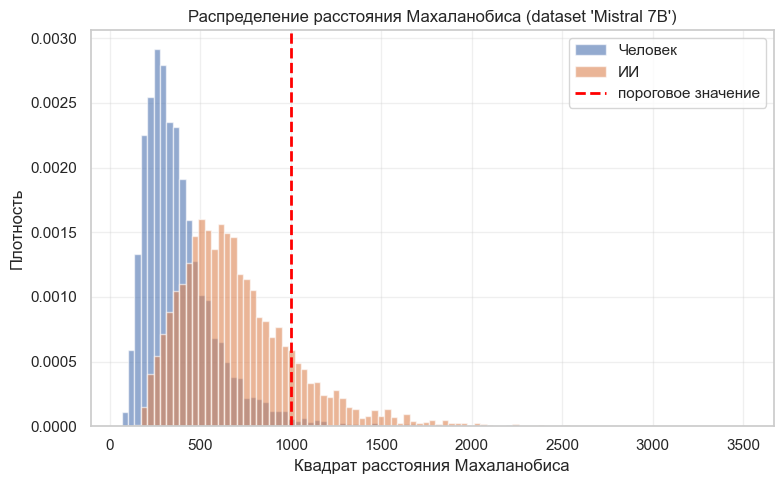

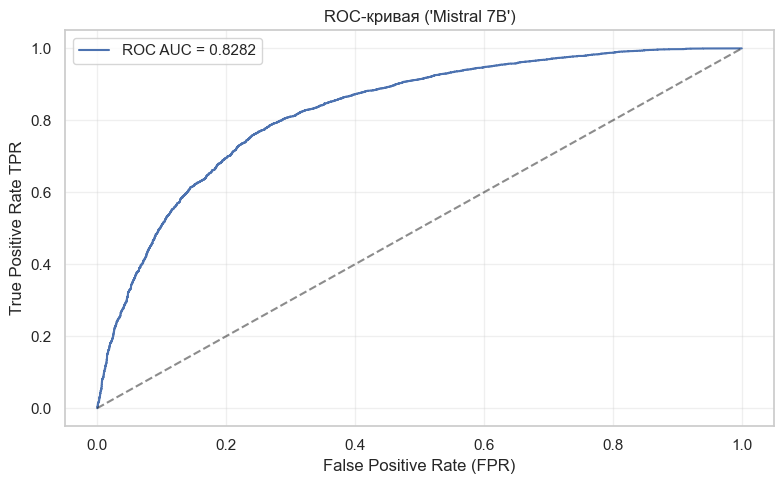

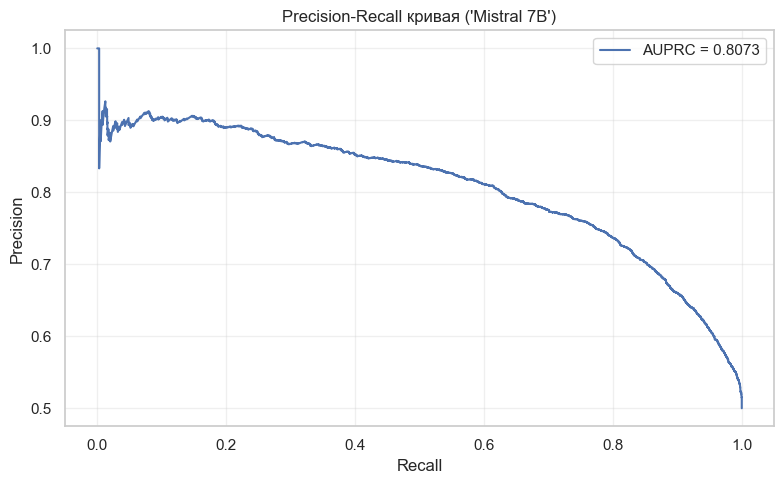

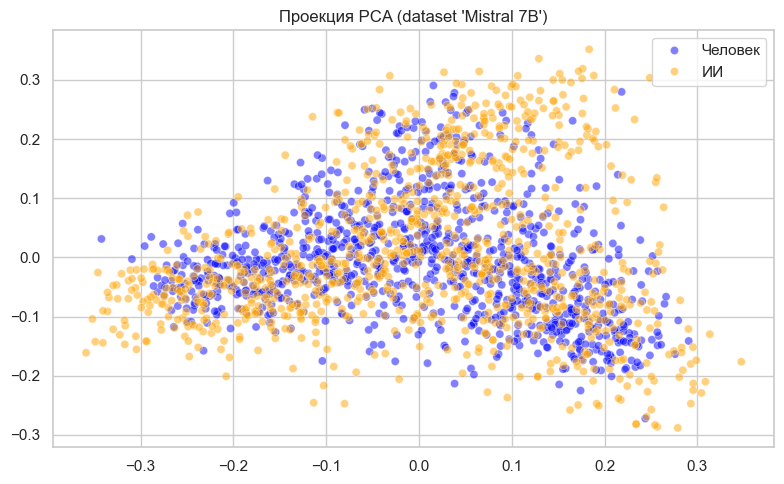


Dataset: Llama 3 13B
----------------------------------------
Количество объектов в 0 классе     : 5011
Количество объектов в 1 классе     : 4989


100%|█████████████████████████████████████| 10000/10000 [04:40<00:00, 35.67it/s]


ROC-AUC                            : 0.8391
AUPRC                              : 0.8316
F1-score                           : 0.3475


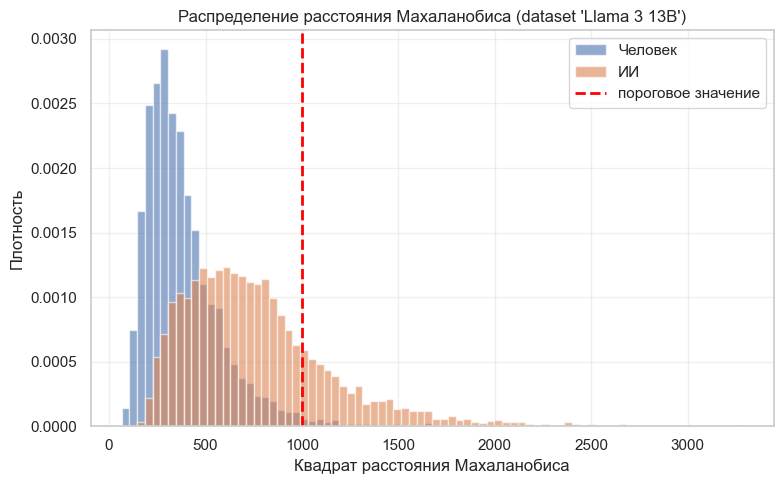

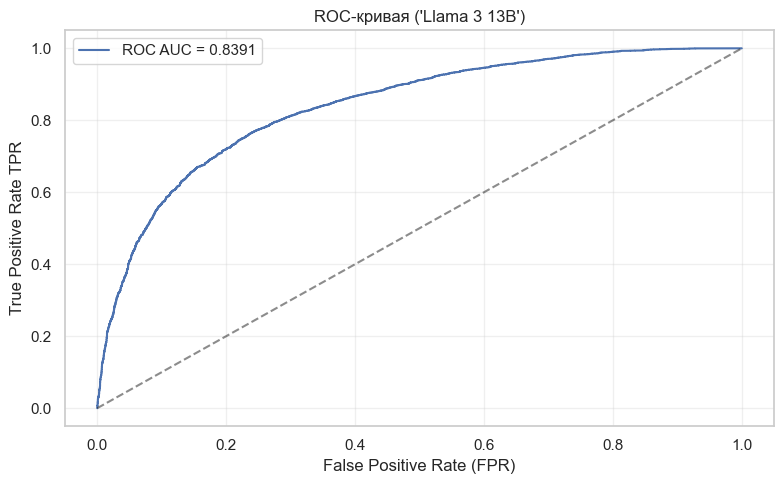

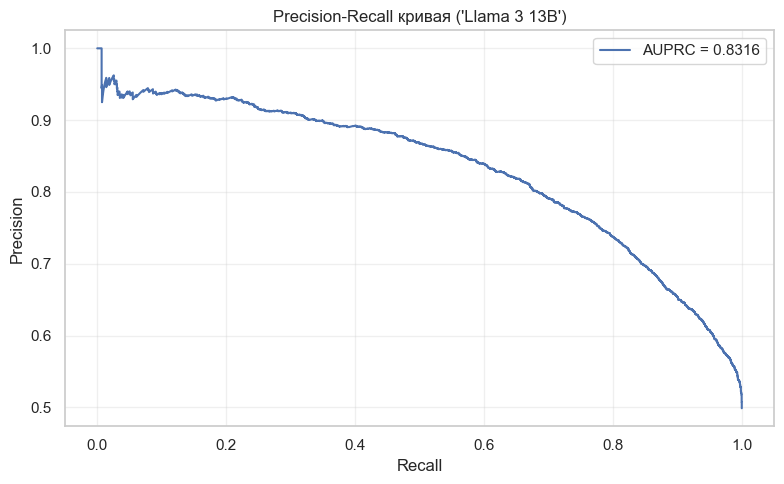

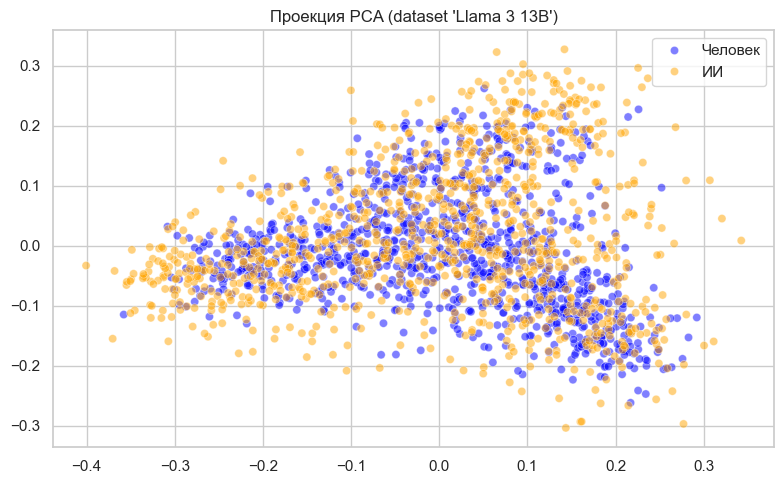


Dataset: DeepSeek V3.2
----------------------------------------
Количество объектов в 0 классе     : 5000
Количество объектов в 1 классе     : 5000


100%|█████████████████████████████████████| 10000/10000 [05:08<00:00, 32.39it/s]


ROC-AUC                            : 0.7532
AUPRC                              : 0.7087
F1-score                           : 0.1272


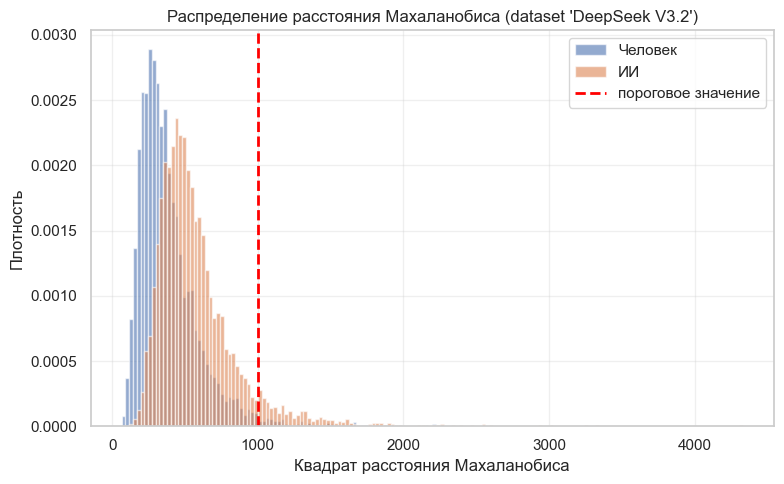

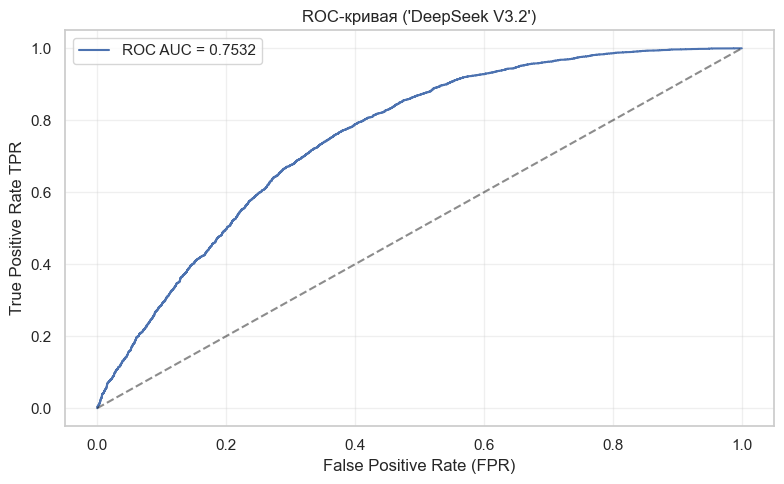

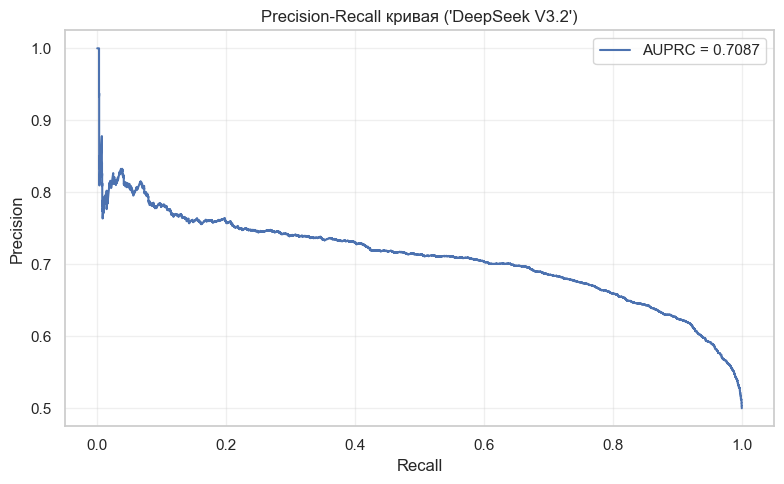

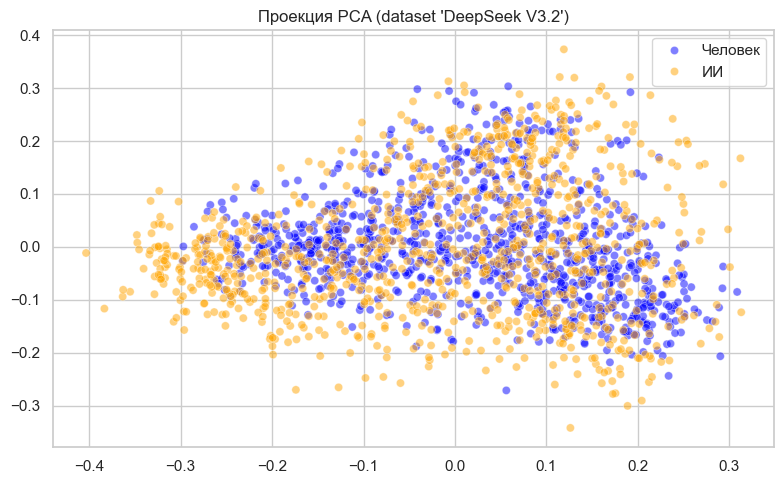


Dataset: ChatGPT
----------------------------------------
Количество объектов в 0 классе     : 5000
Количество объектов в 1 классе     : 5000


100%|█████████████████████████████████████| 10000/10000 [04:45<00:00, 34.98it/s]


ROC-AUC                            : 0.8308
AUPRC                              : 0.8135
F1-score                           : 0.2689


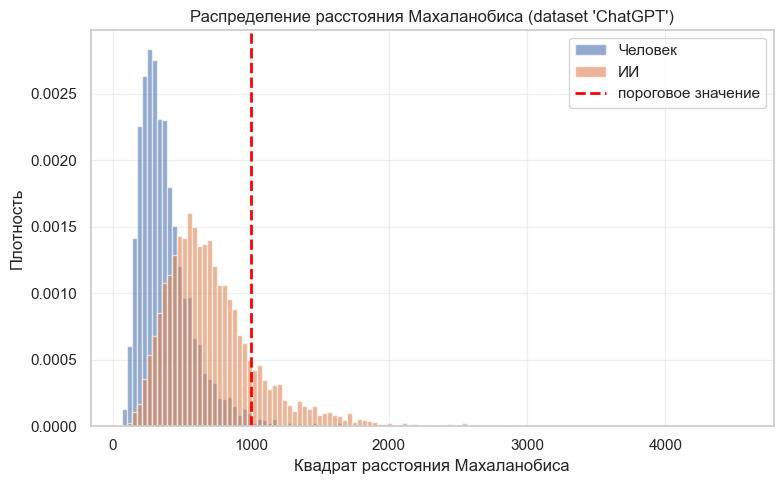

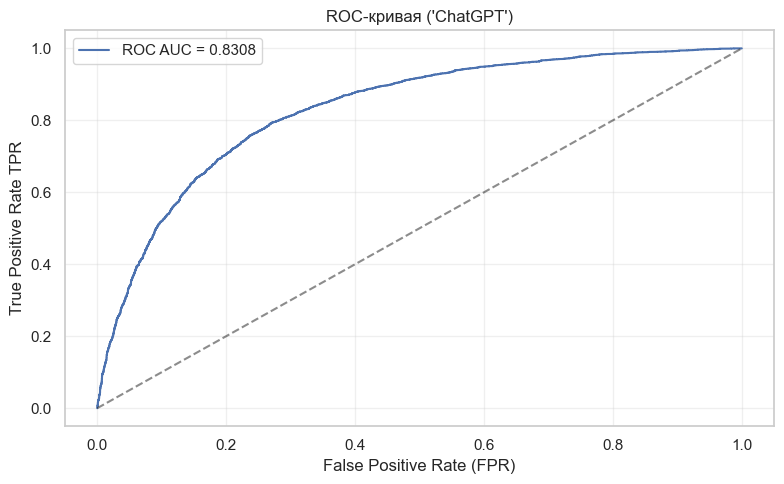

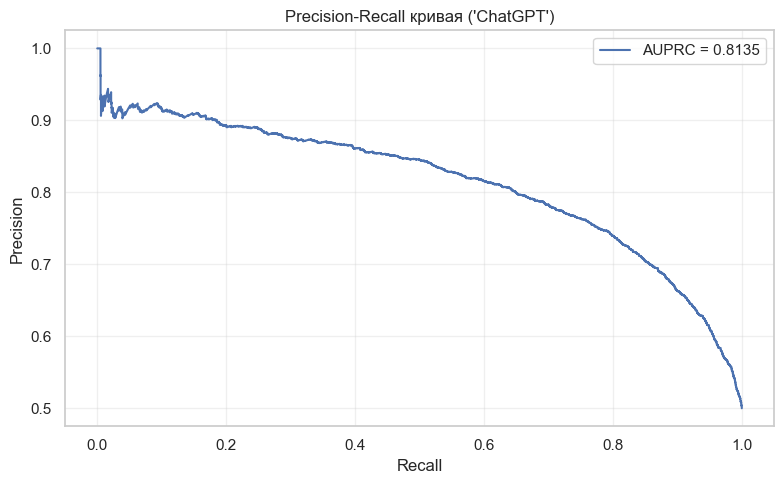

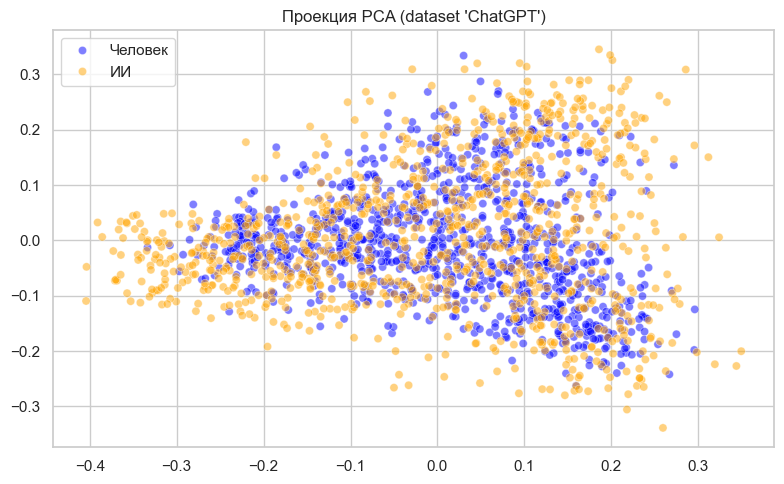


Эмбеддер: all-MiniLM-L6-v2
Доля синтетических текстов: 10.0%

Dataset: Mistral 7B
----------------------------------------
Количество объектов в 0 классе     : 9000
Количество объектов в 1 классе     : 1000


100%|█████████████████████████████████████| 10000/10000 [05:45<00:00, 28.97it/s]


ROC-AUC                            : 0.8431
AUPRC                              : 0.3737
F1-score                           : 0.2485


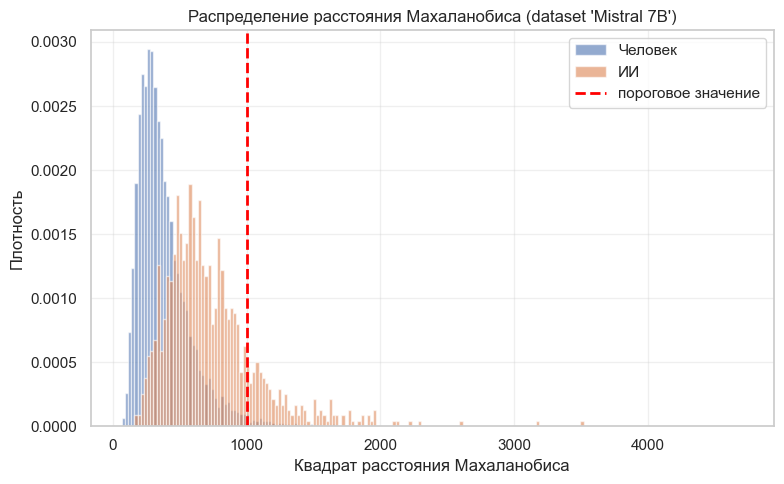

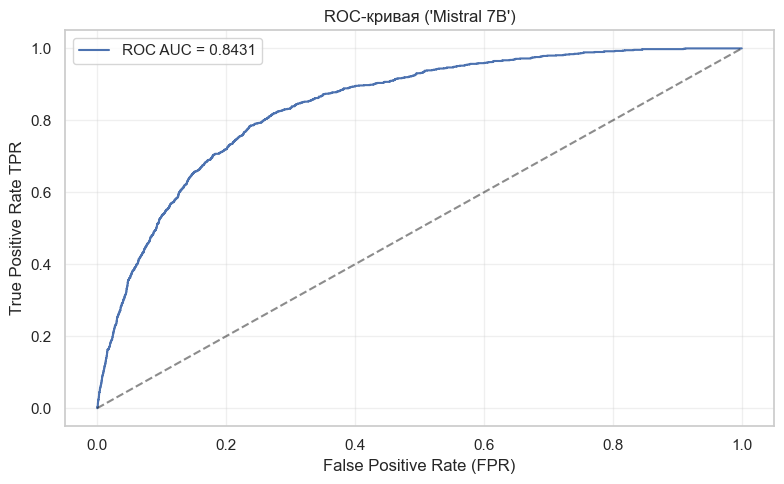

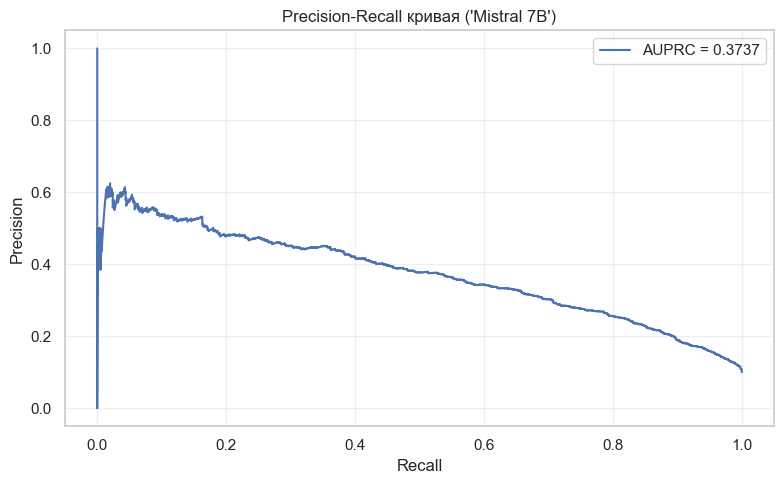

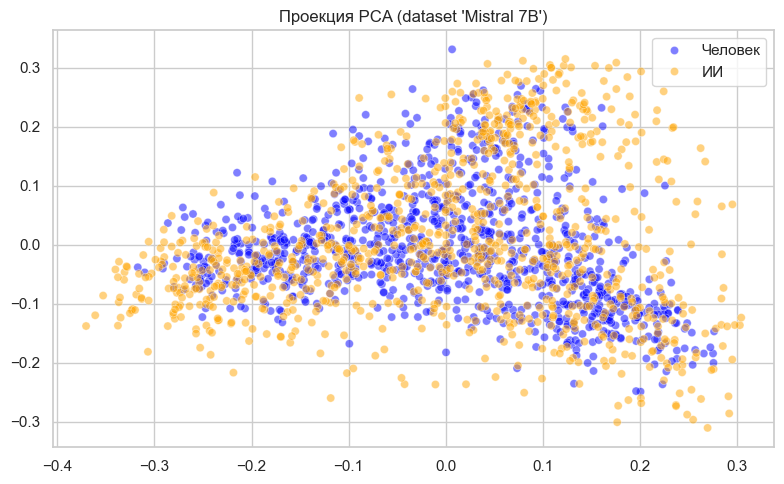


Dataset: Llama 3 13B
----------------------------------------
Количество объектов в 0 классе     : 9000
Количество объектов в 1 классе     : 1000


100%|█████████████████████████████████████| 10000/10000 [05:05<00:00, 32.69it/s]


ROC-AUC                            : 0.8405
AUPRC                              : 0.4091
F1-score                           : 0.2927


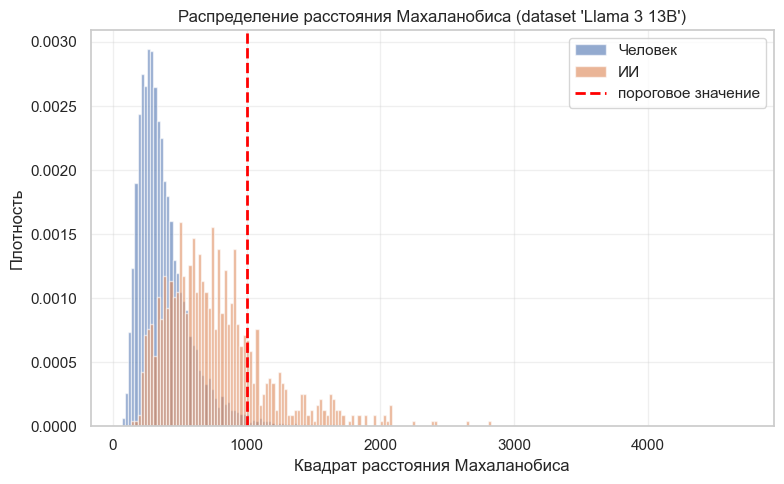

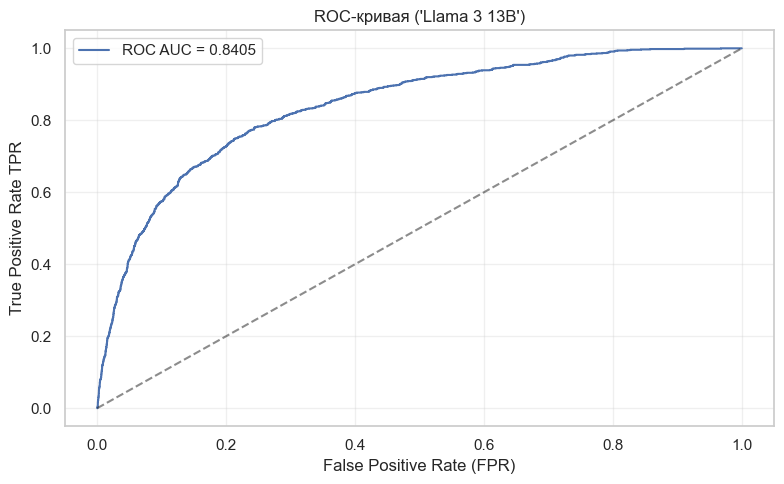

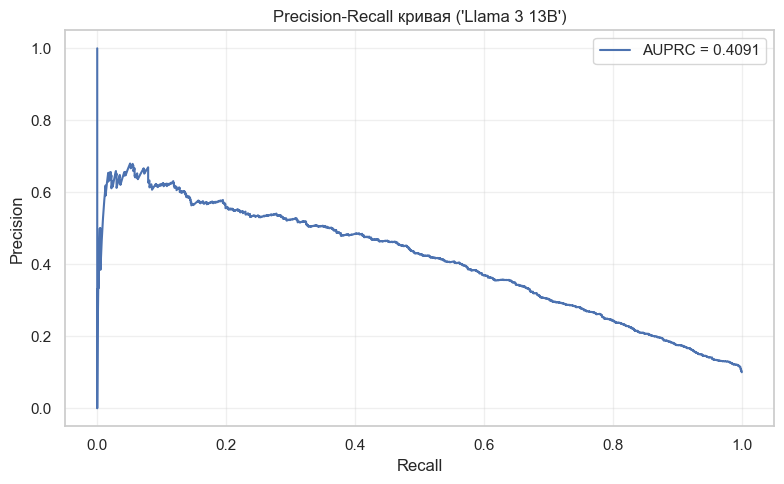

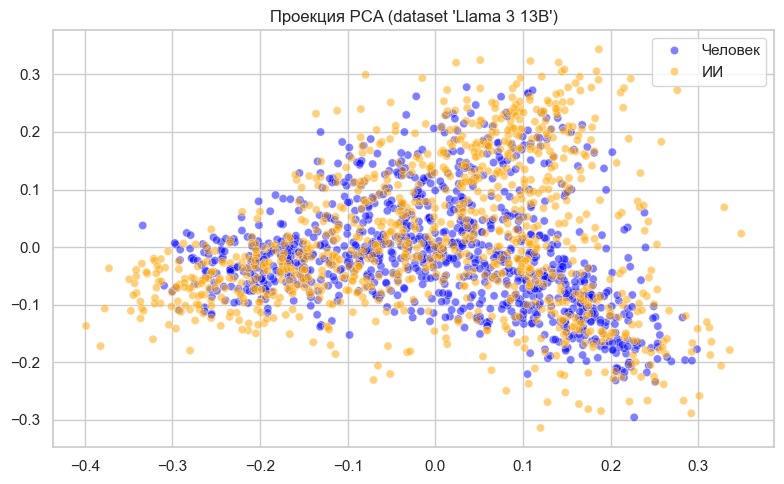


Dataset: DeepSeek V3.2
----------------------------------------
Количество объектов в 0 классе     : 9000
Количество объектов в 1 классе     : 1000


100%|█████████████████████████████████████| 10000/10000 [05:09<00:00, 32.30it/s]


ROC-AUC                            : 0.7537
AUPRC                              : 0.2170
F1-score                           : 0.1055


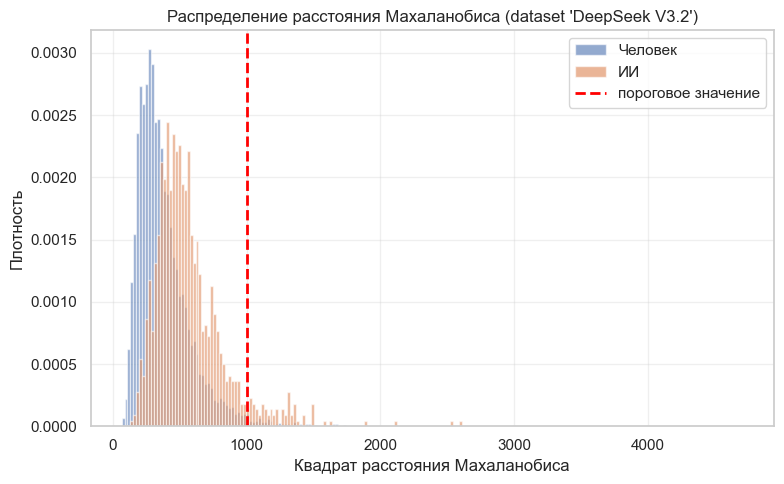

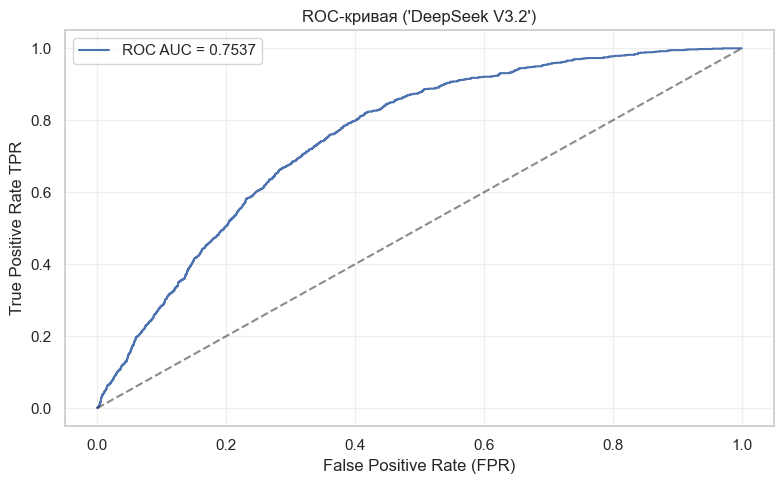

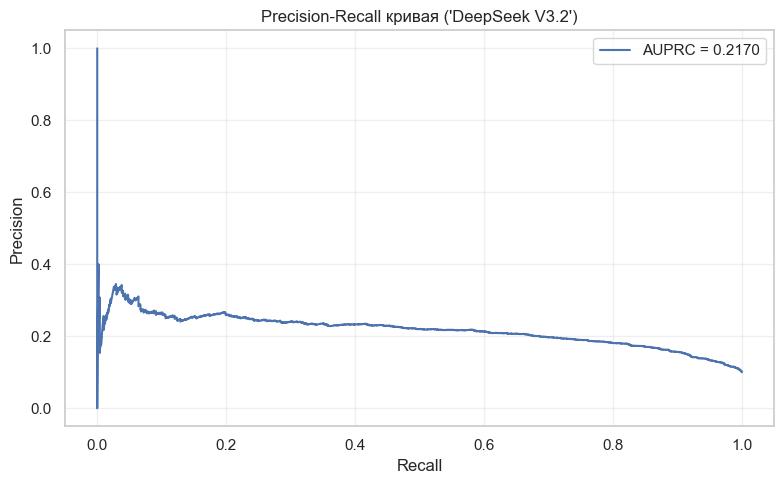

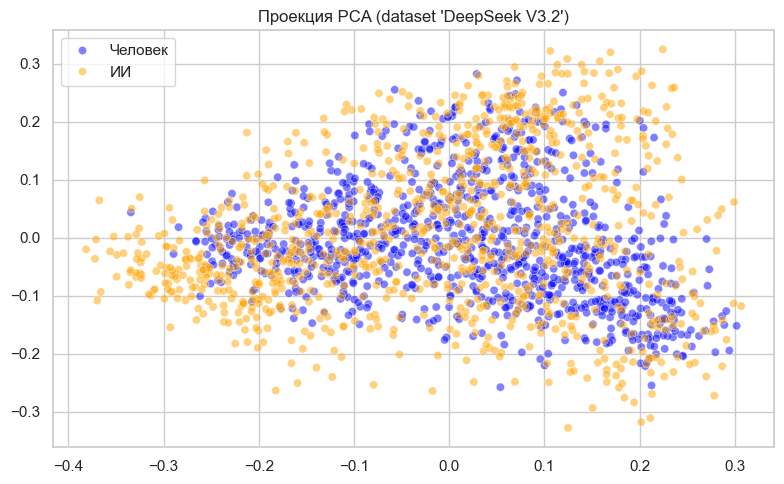


Dataset: ChatGPT
----------------------------------------
Количество объектов в 0 классе     : 9000
Количество объектов в 1 классе     : 1000


100%|█████████████████████████████████████| 10000/10000 [05:16<00:00, 31.60it/s]


ROC-AUC                            : 0.8348
AUPRC                              : 0.3593
F1-score                           : 0.2296


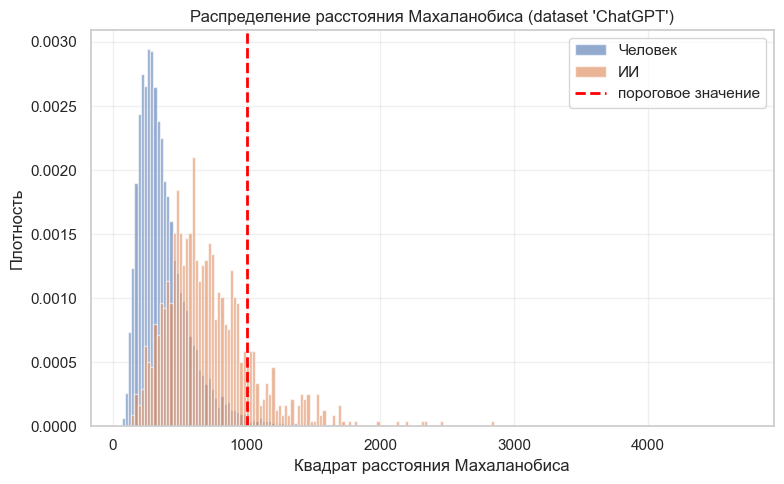

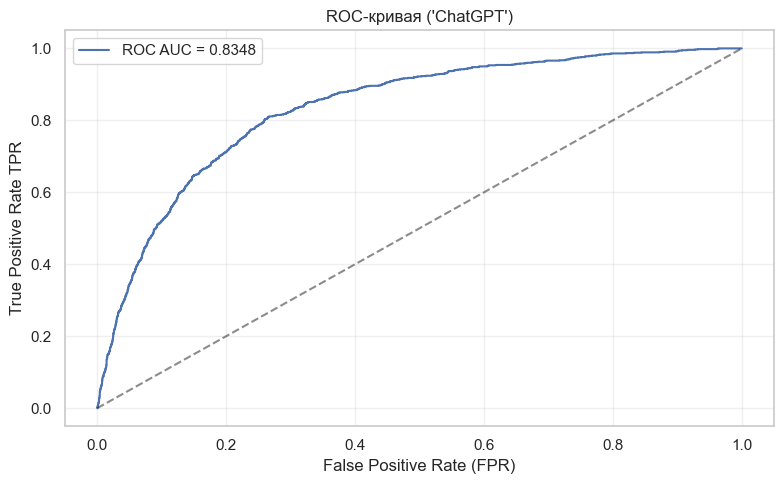

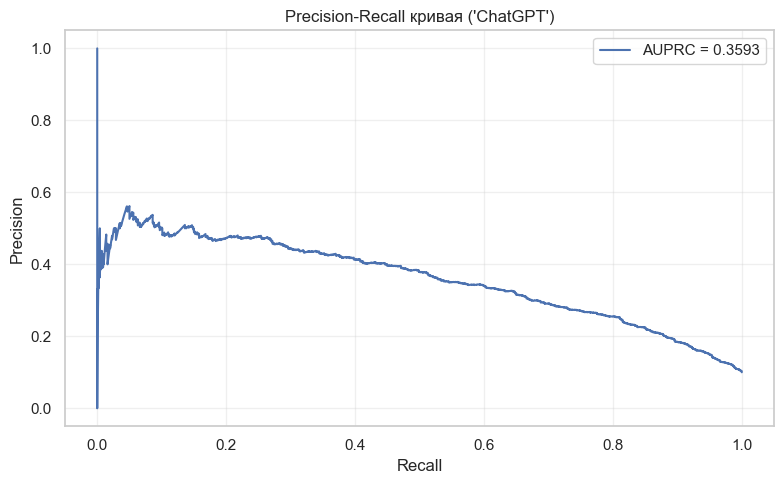

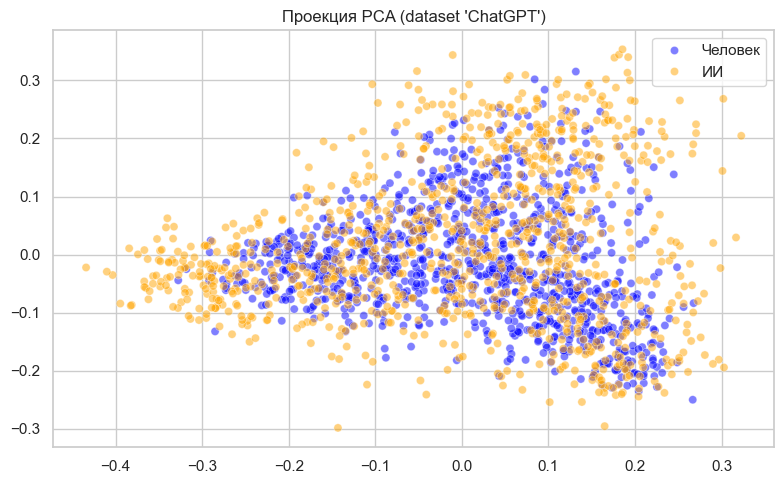


Эмбеддер: all-MiniLM-L6-v2
Доля синтетических текстов: 1.0%

Dataset: Mistral 7B
----------------------------------------
Количество объектов в 0 классе     : 9900
Количество объектов в 1 классе     : 100


100%|█████████████████████████████████████| 10000/10000 [05:31<00:00, 30.18it/s]


ROC-AUC                            : 0.8553
AUPRC                              : 0.0650
F1-score                           : 0.1263


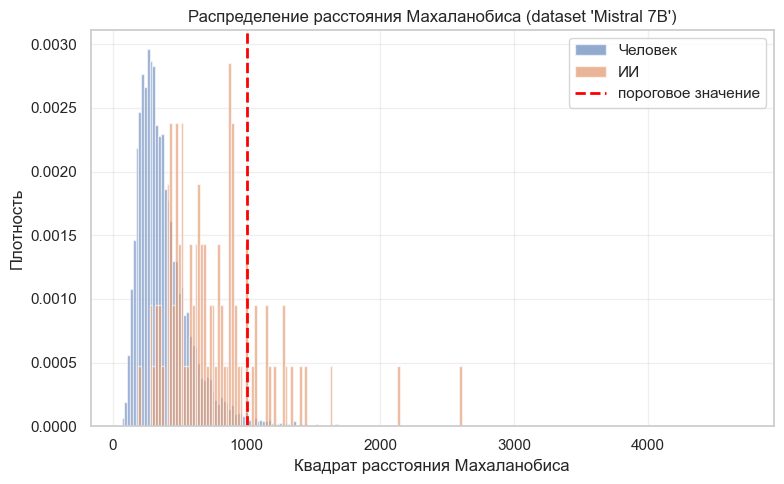

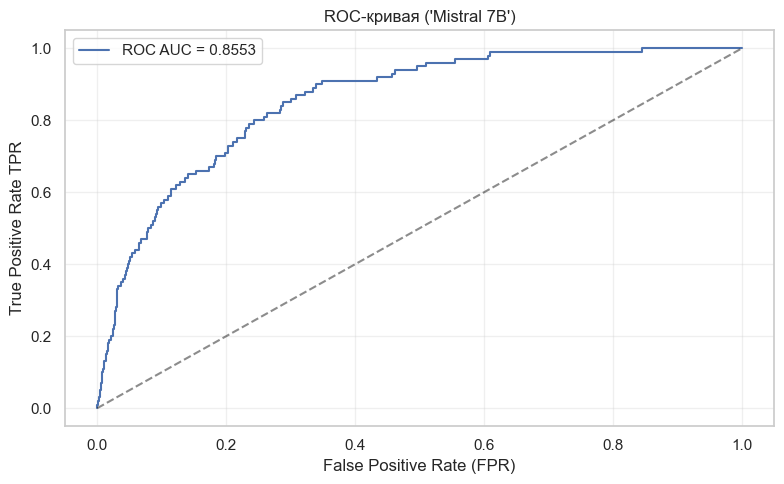

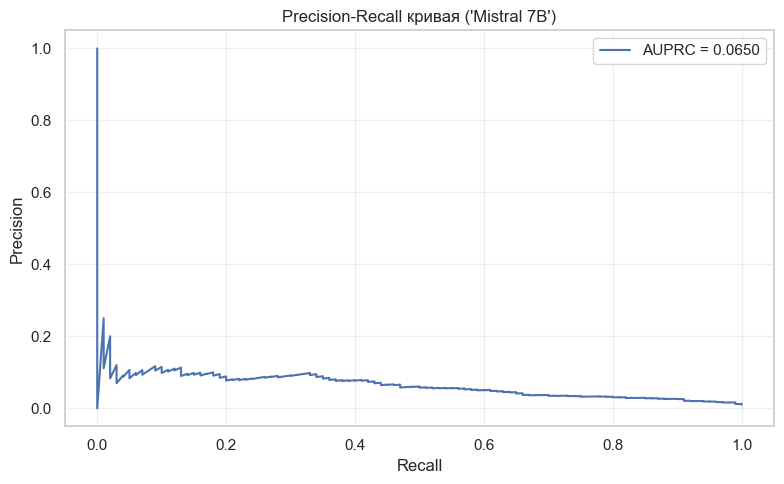

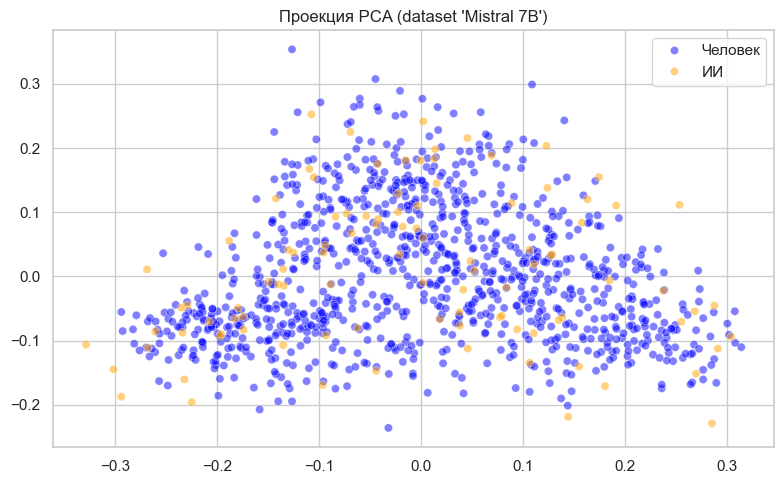


Dataset: Llama 3 13B
----------------------------------------
Количество объектов в 0 классе     : 9900
Количество объектов в 1 классе     : 100


100%|█████████████████████████████████████| 10000/10000 [05:21<00:00, 31.11it/s]


ROC-AUC                            : 0.8409
AUPRC                              : 0.0697
F1-score                           : 0.1263


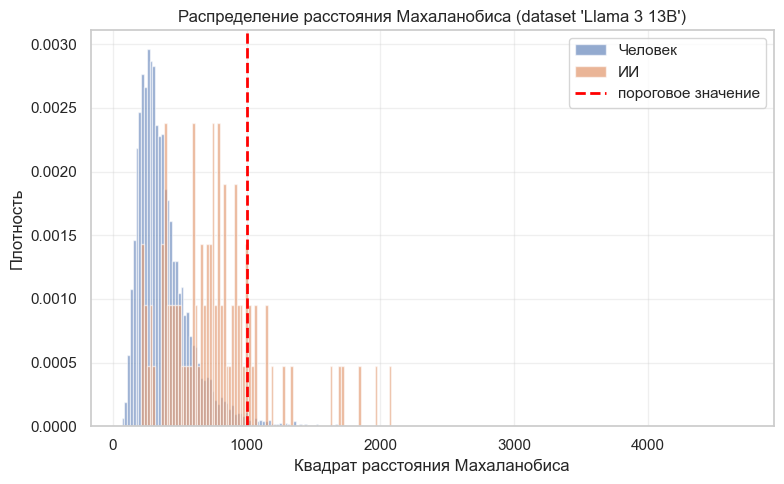

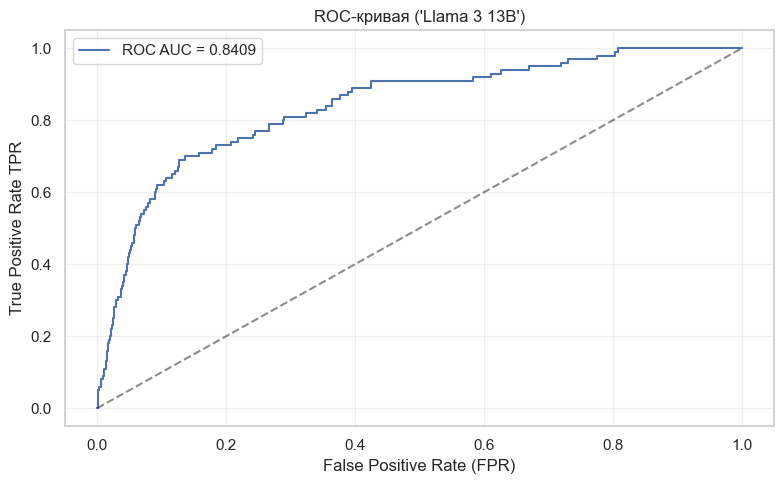

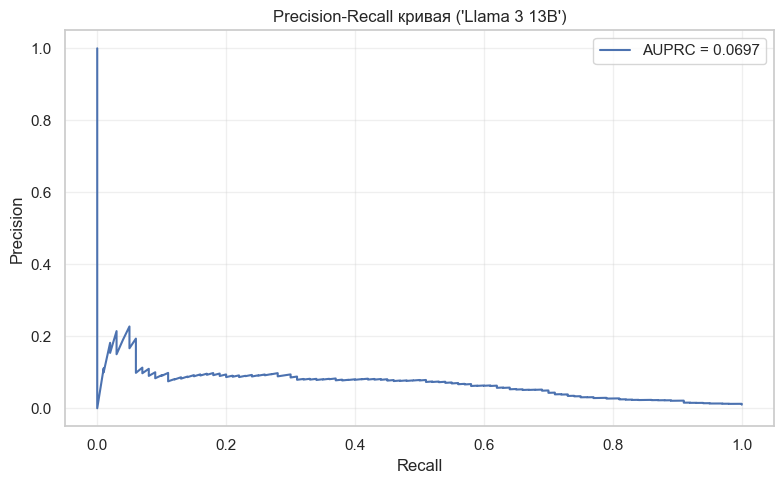

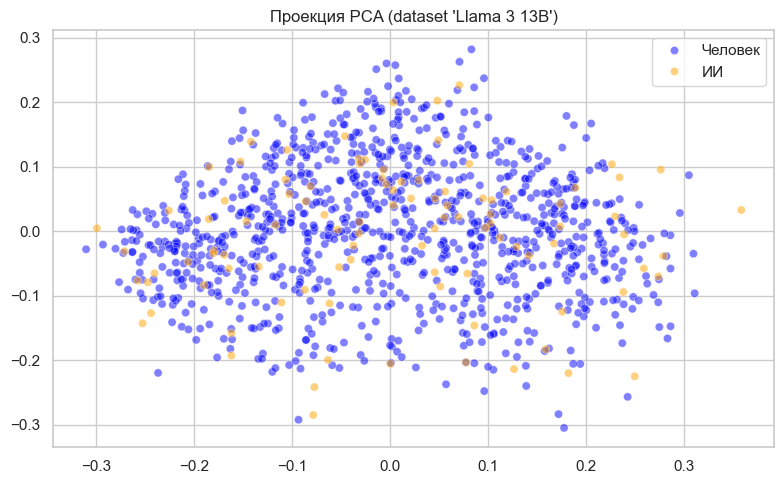


Dataset: DeepSeek V3.2
----------------------------------------
Количество объектов в 0 классе     : 9900
Количество объектов в 1 классе     : 100


100%|█████████████████████████████████████| 10000/10000 [05:10<00:00, 32.18it/s]


ROC-AUC                            : 0.7736
AUPRC                              : 0.0272
F1-score                           : 0.0511


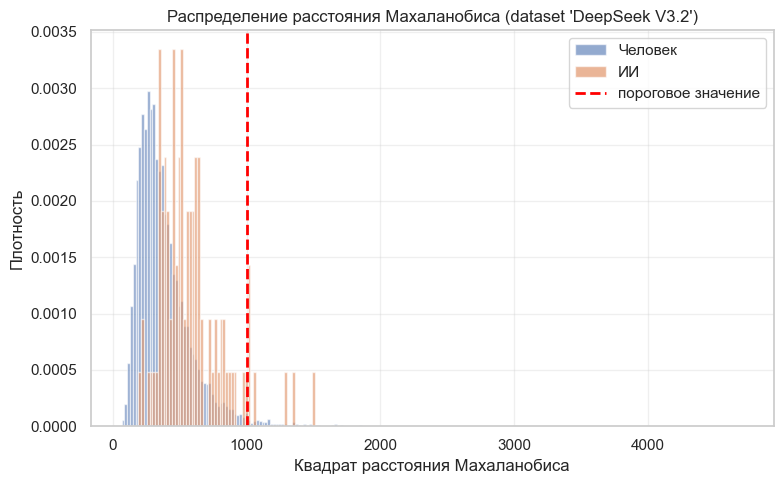

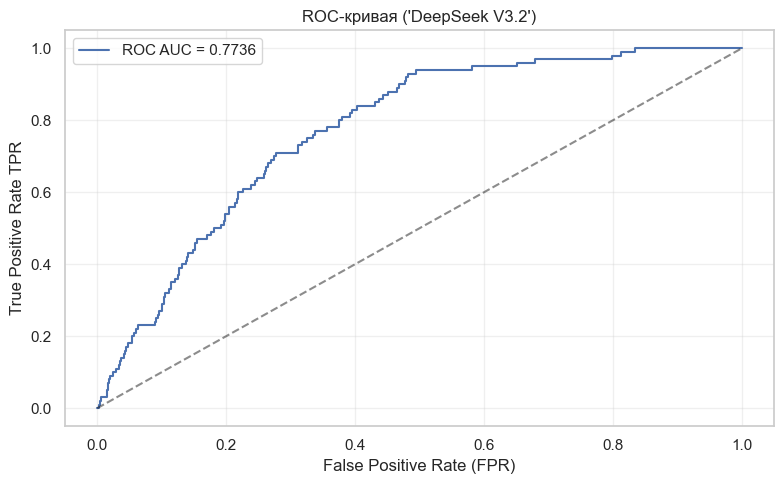

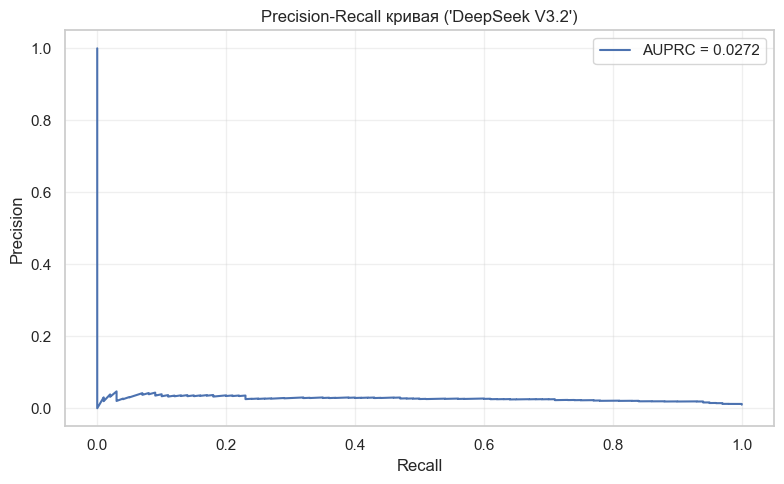

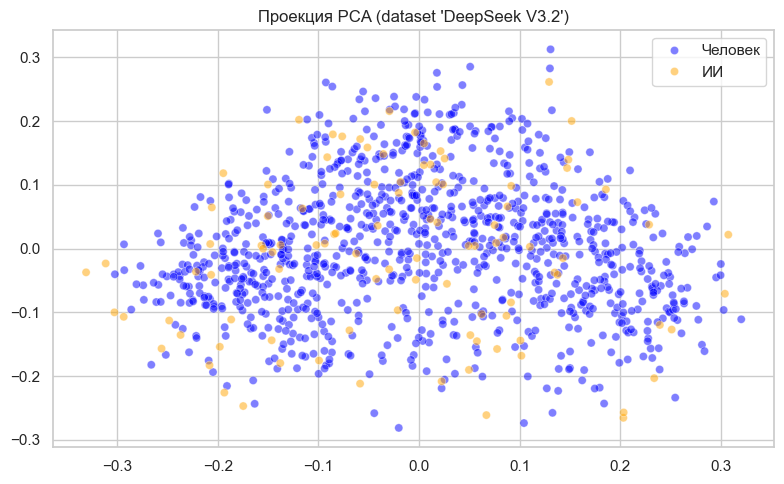


Dataset: ChatGPT
----------------------------------------
Количество объектов в 0 классе     : 9900
Количество объектов в 1 классе     : 100


100%|█████████████████████████████████████| 10000/10000 [05:14<00:00, 31.81it/s]


ROC-AUC                            : 0.8385
AUPRC                              : 0.0597
F1-score                           : 0.1263


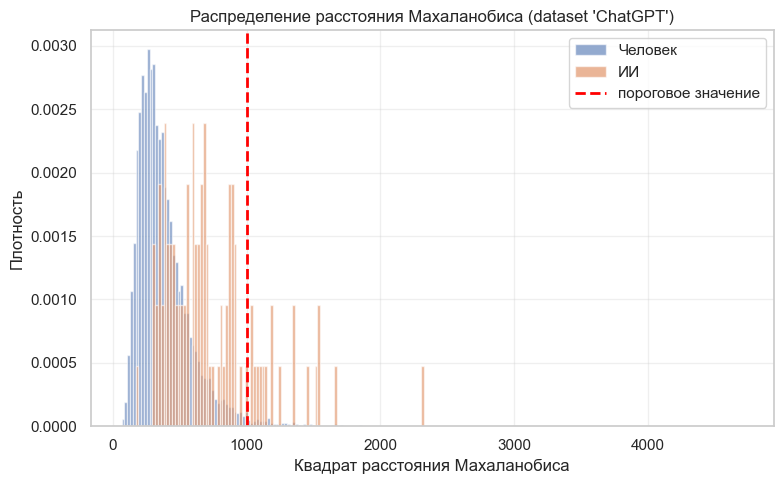

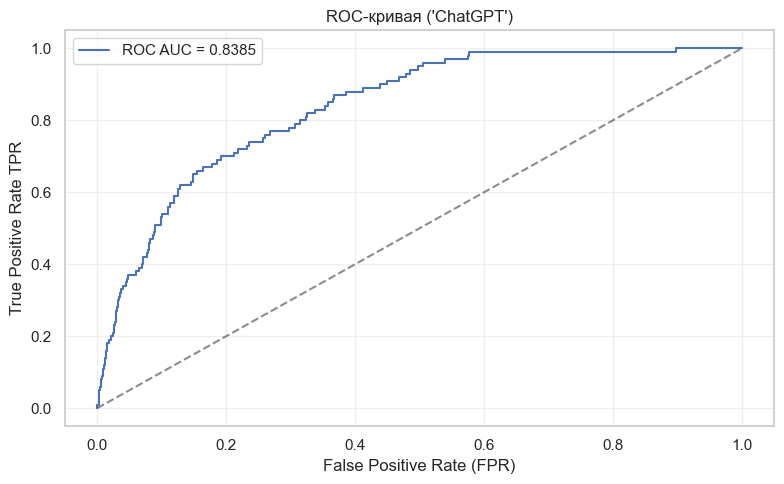

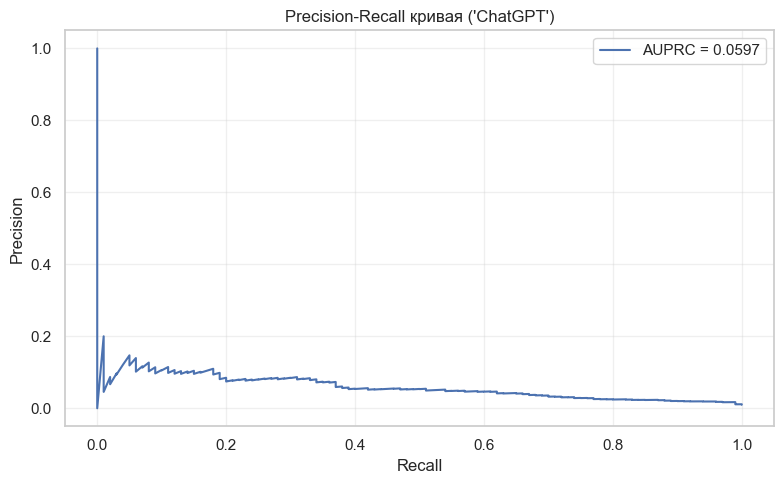

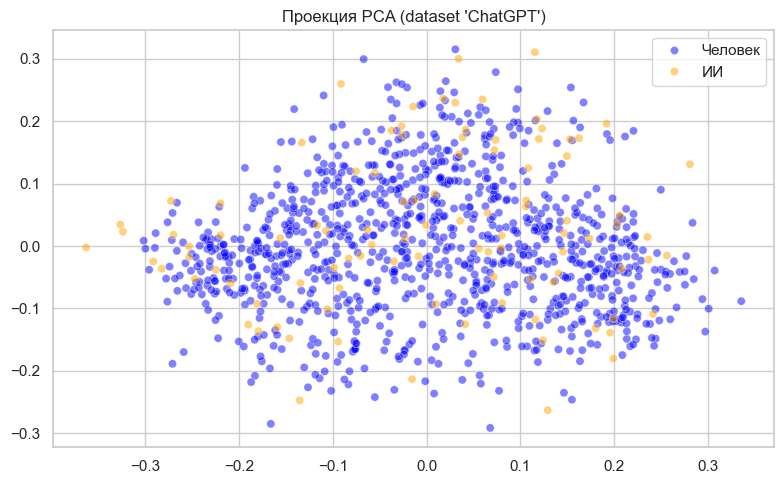

100%|█████████████████████████████████████| 10000/10000 [39:06<00:00,  4.26it/s]


Пороговое значение (q=0.99)        : 1941.6614

Эмбеддер: all-mpnet-base-v2
Доля синтетических текстов: 50.0%

Dataset: Mistral 7B
----------------------------------------
Количество объектов в 0 классе     : 5000
Количество объектов в 1 классе     : 5000


100%|█████████████████████████████████████| 10000/10000 [20:27<00:00,  8.15it/s]


ROC-AUC                            : 0.8381
AUPRC                              : 0.8154
F1-score                           : 0.3343


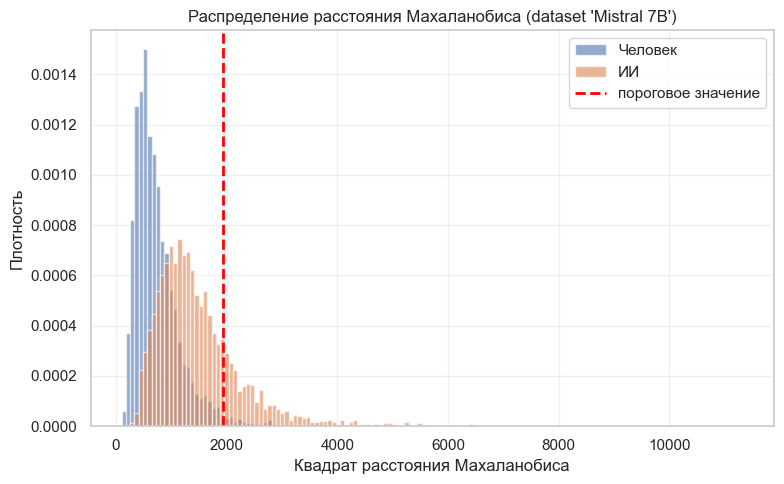

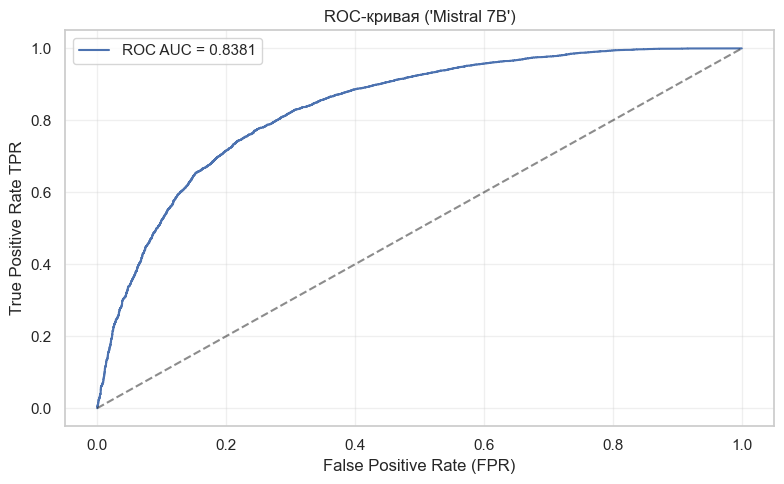

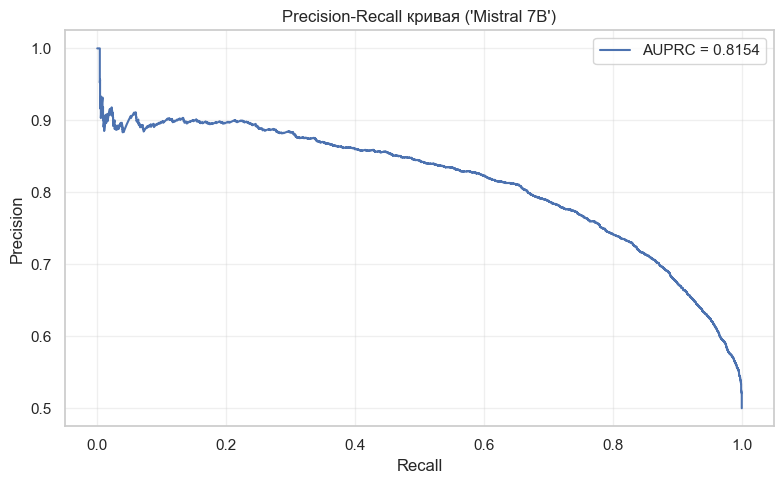

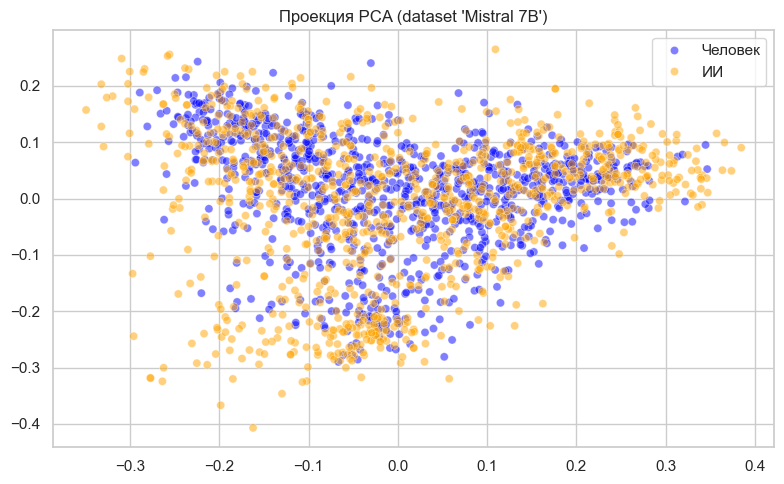


Dataset: Llama 3 13B
----------------------------------------
Количество объектов в 0 классе     : 5011
Количество объектов в 1 классе     : 4989


100%|█████████████████████████████████████| 10000/10000 [19:10<00:00,  8.69it/s]


ROC-AUC                            : 0.8511
AUPRC                              : 0.8400
F1-score                           : 0.4233


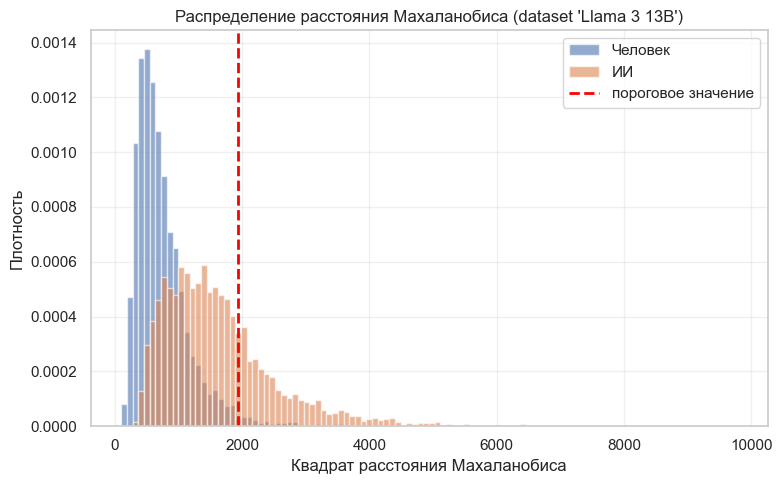

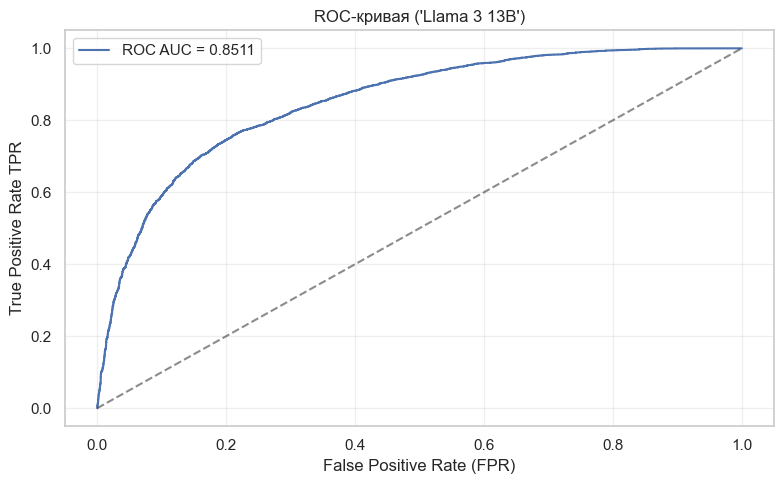

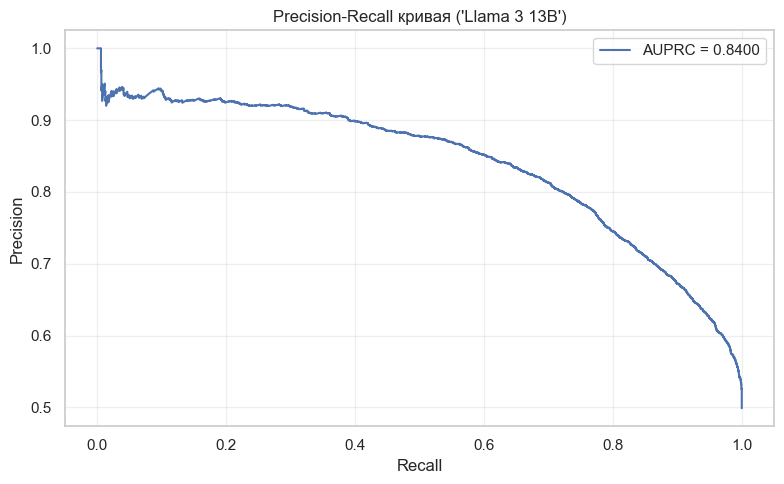

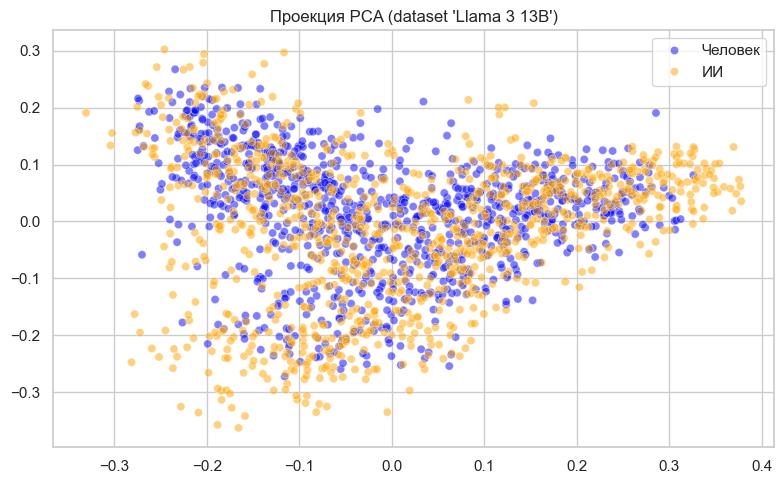


Dataset: DeepSeek V3.2
----------------------------------------
Количество объектов в 0 классе     : 5000
Количество объектов в 1 классе     : 5000


100%|█████████████████████████████████████| 10000/10000 [21:58<00:00,  7.59it/s]


ROC-AUC                            : 0.7803
AUPRC                              : 0.7375
F1-score                           : 0.1871


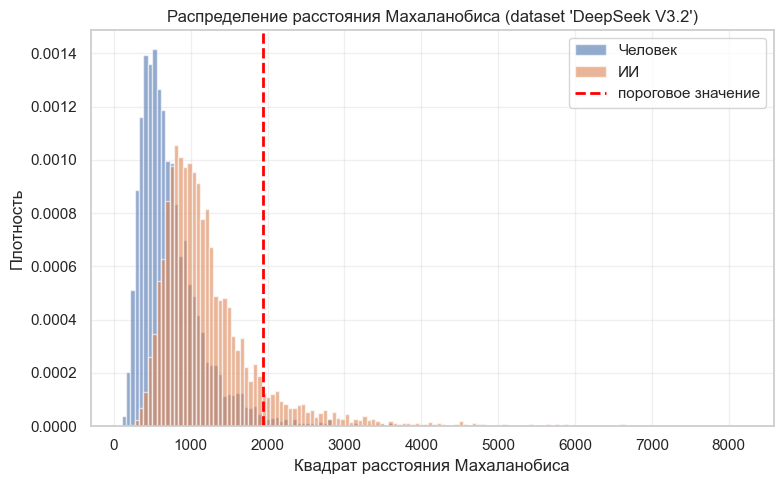

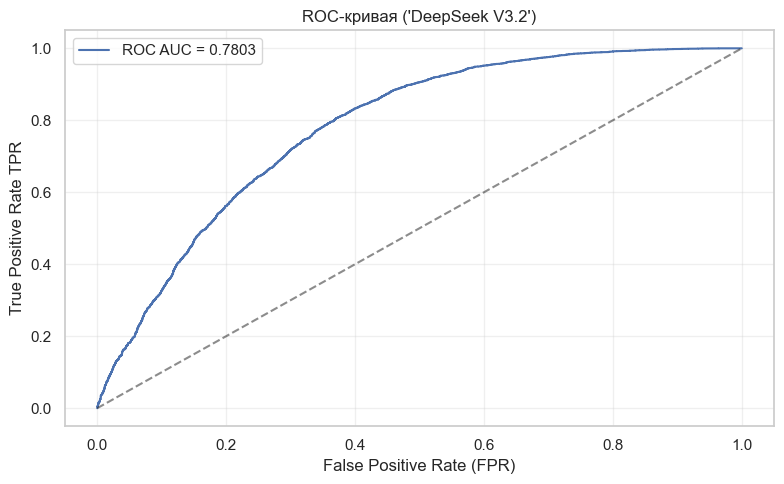

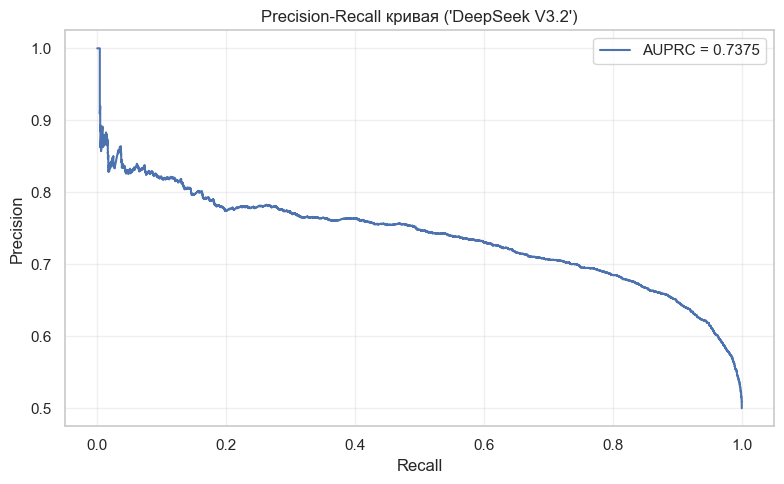

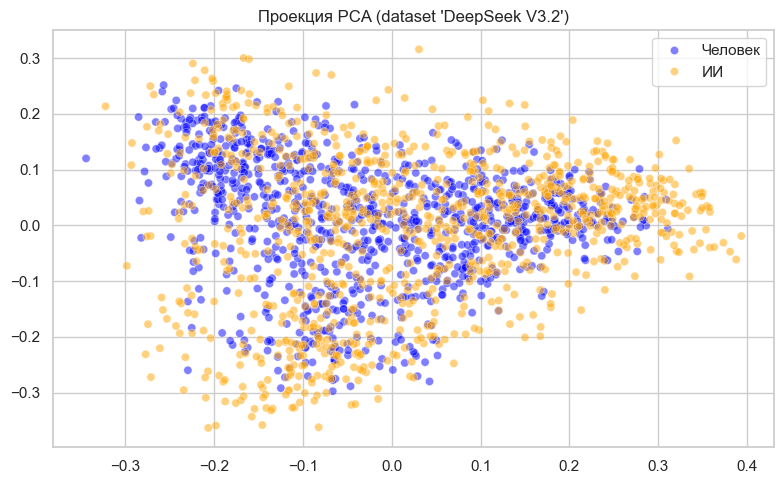


Dataset: ChatGPT
----------------------------------------
Количество объектов в 0 классе     : 5000
Количество объектов в 1 классе     : 5000


100%|█████████████████████████████████████| 10000/10000 [20:38<00:00,  8.08it/s]


ROC-AUC                            : 0.8484
AUPRC                              : 0.8291
F1-score                           : 0.3562


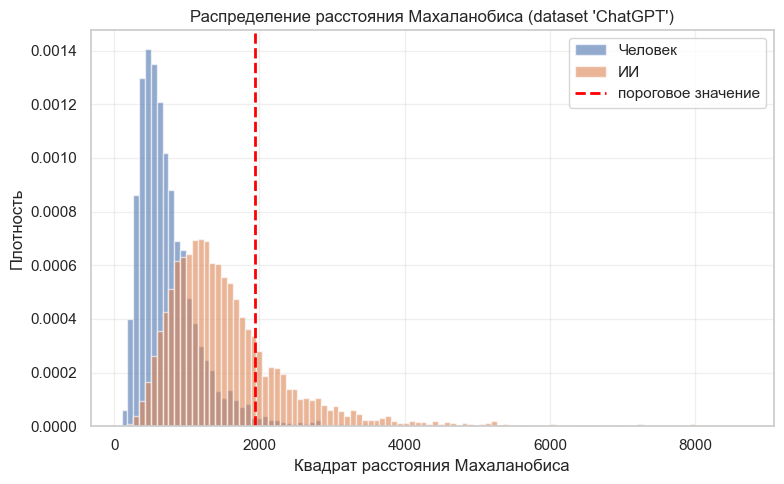

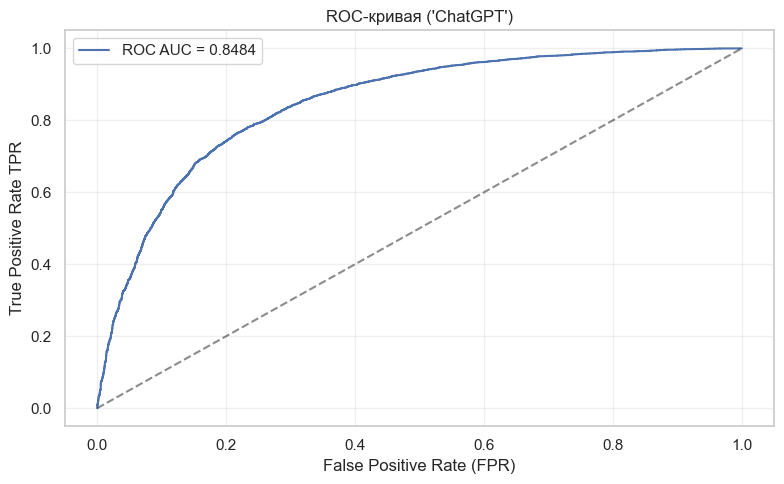

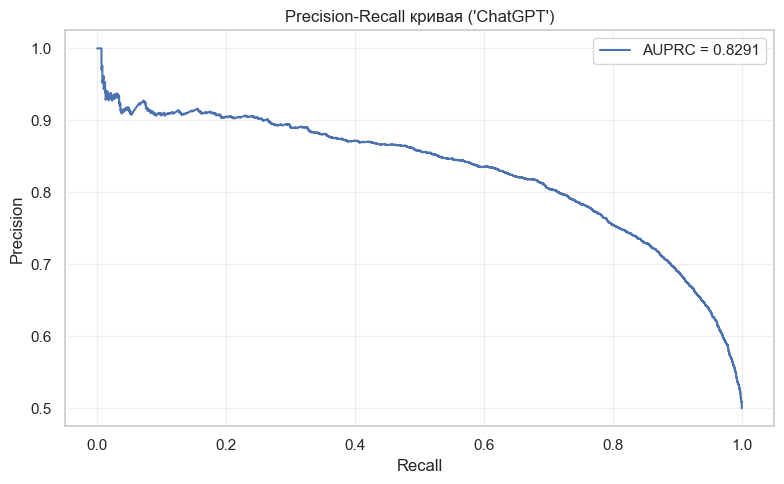

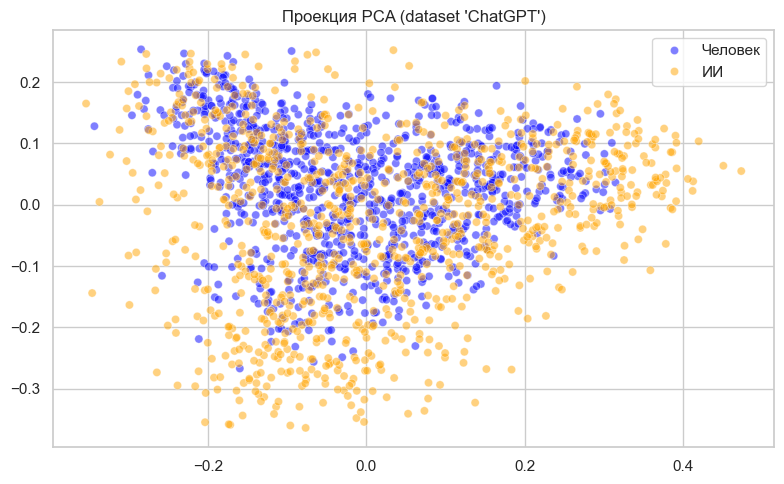


Эмбеддер: all-mpnet-base-v2
Доля синтетических текстов: 10.0%

Dataset: Mistral 7B
----------------------------------------
Количество объектов в 0 классе     : 9000
Количество объектов в 1 классе     : 1000


100%|█████████████████████████████████████| 10000/10000 [25:13<00:00,  6.61it/s]


ROC-AUC                            : 0.8538
AUPRC                              : 0.3905
F1-score                           : 0.3097


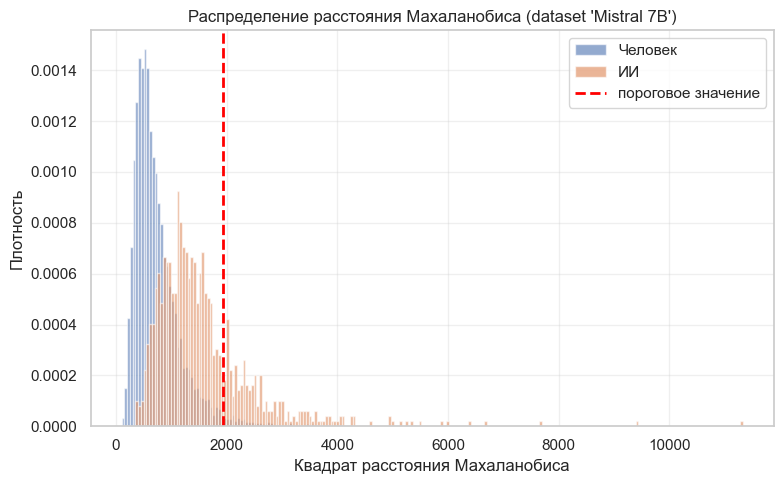

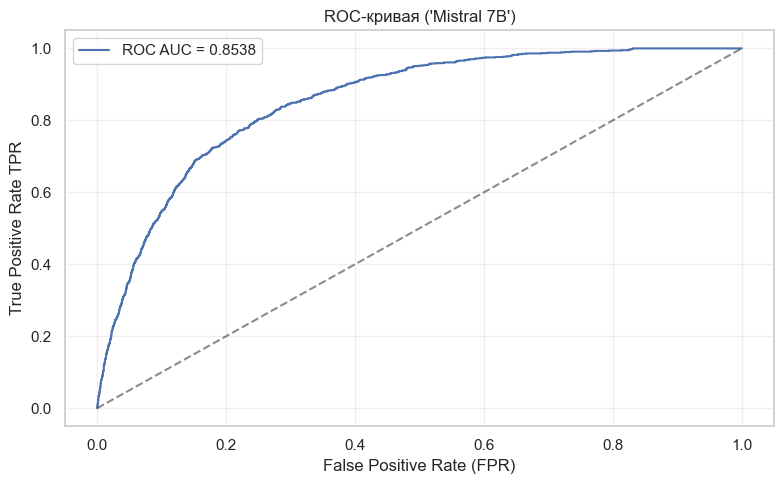

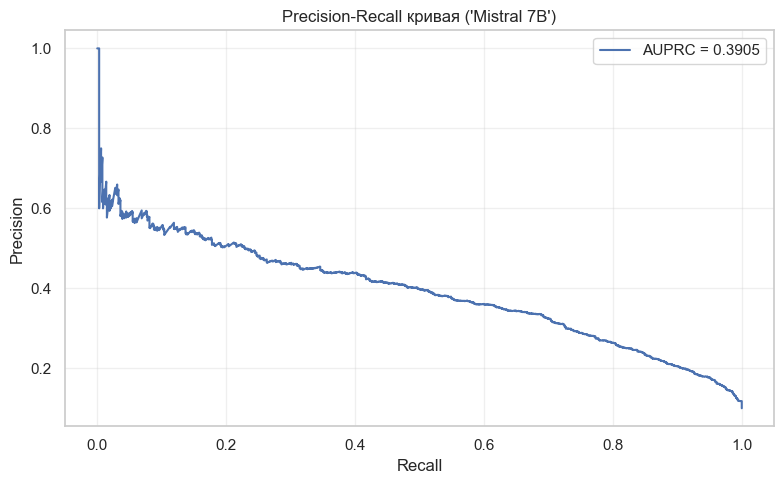

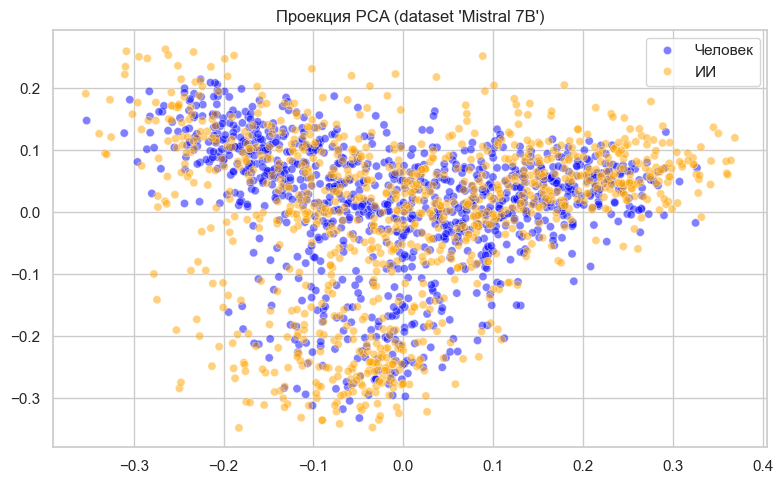


Dataset: Llama 3 13B
----------------------------------------
Количество объектов в 0 классе     : 9000
Количество объектов в 1 классе     : 1000


100%|█████████████████████████████████████| 10000/10000 [24:39<00:00,  6.76it/s]


ROC-AUC                            : 0.8529
AUPRC                              : 0.4194
F1-score                           : 0.3576


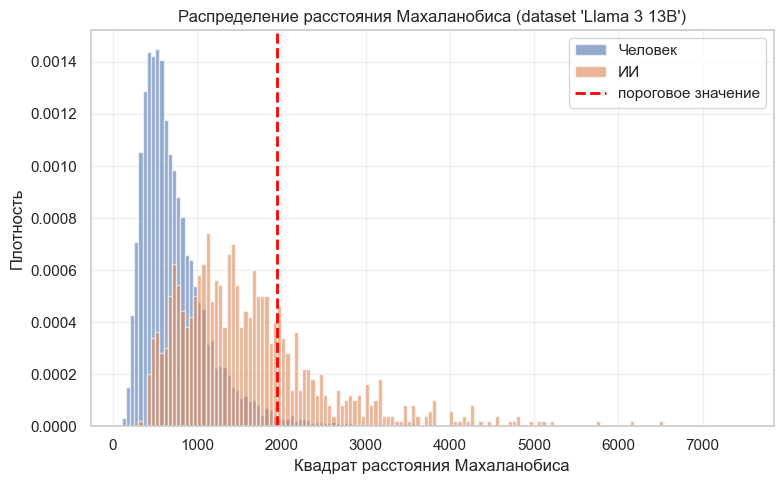

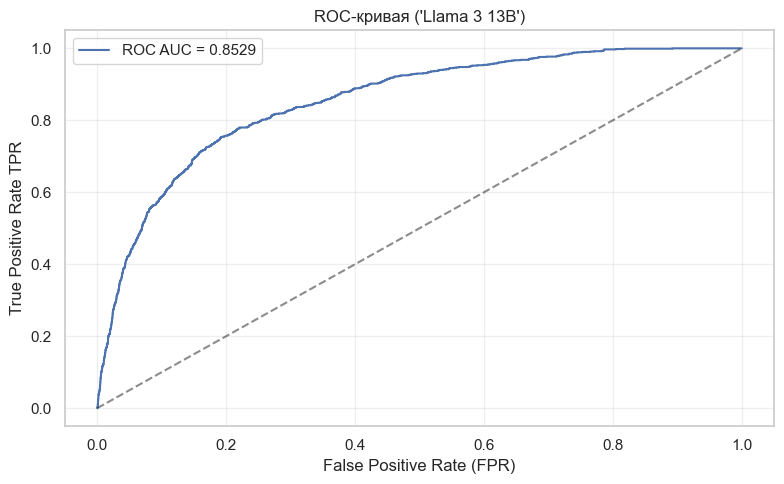

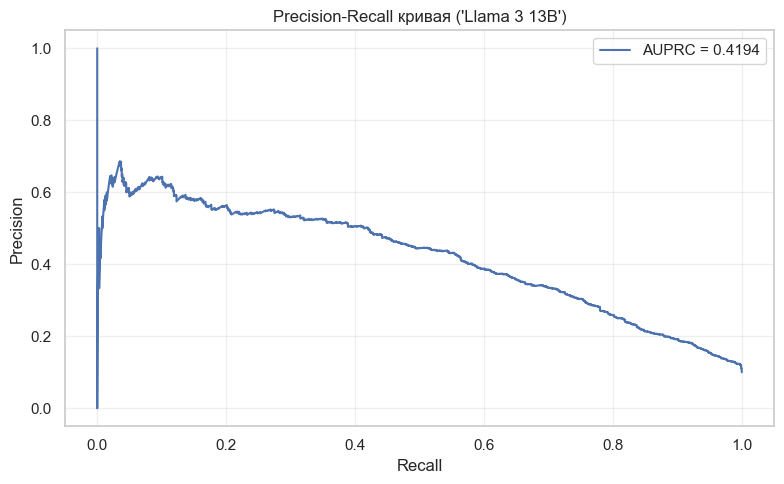

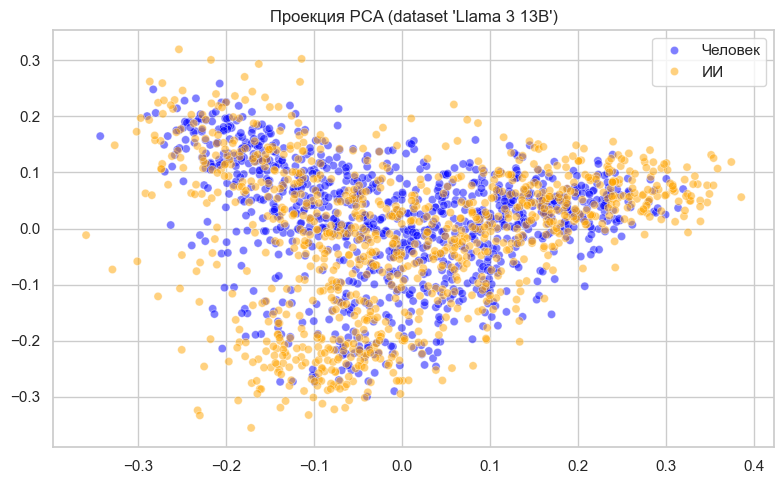


Dataset: DeepSeek V3.2
----------------------------------------
Количество объектов в 0 классе     : 9000
Количество объектов в 1 классе     : 1000


100%|█████████████████████████████████████| 10000/10000 [25:20<00:00,  6.58it/s]


ROC-AUC                            : 0.7807
AUPRC                              : 0.2442
F1-score                           : 0.1505


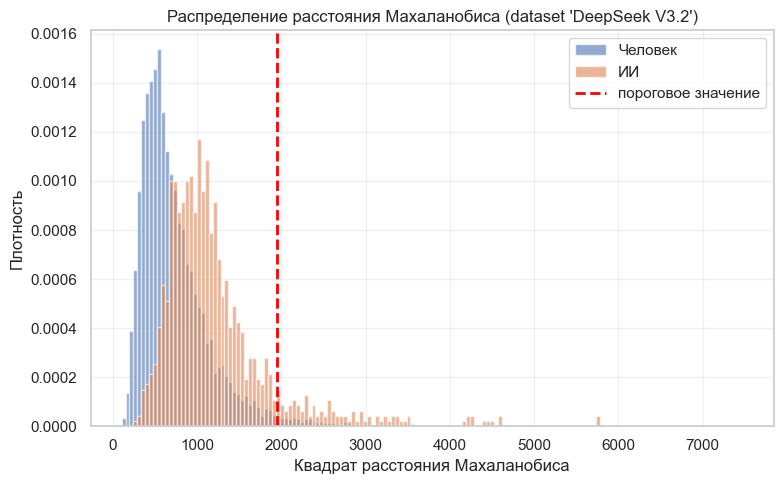

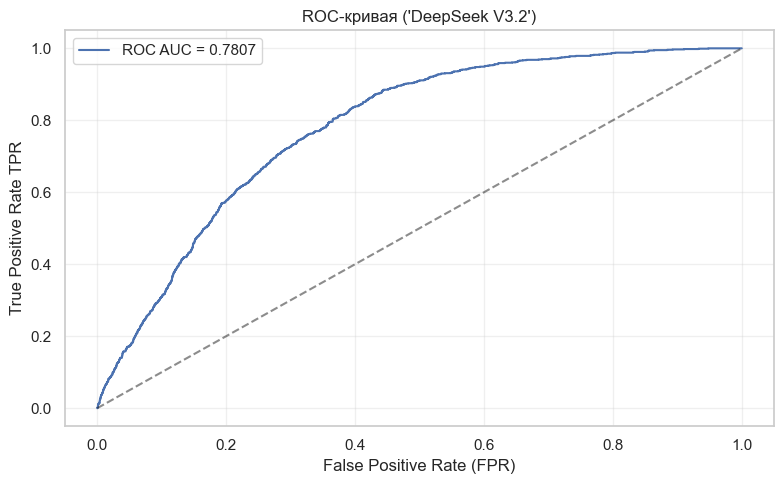

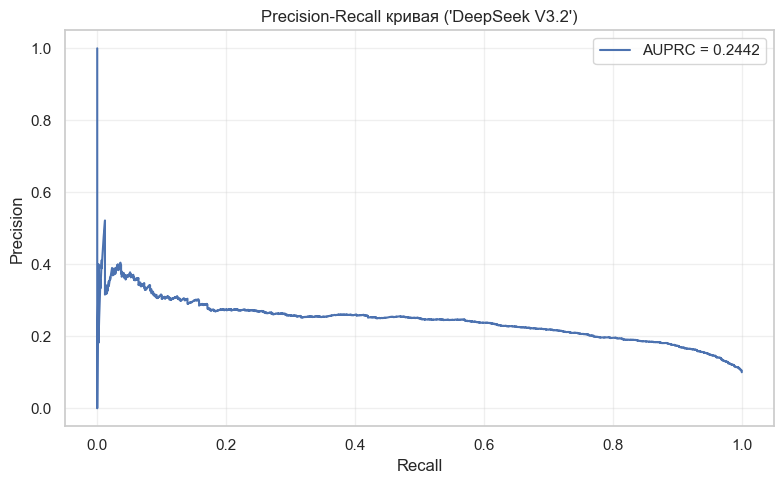

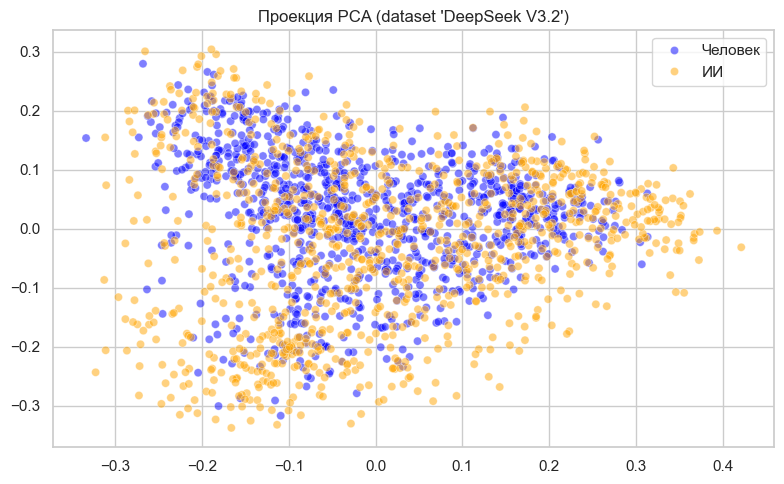


Dataset: ChatGPT
----------------------------------------
Количество объектов в 0 классе     : 9000
Количество объектов в 1 классе     : 1000


100%|█████████████████████████████████████| 10000/10000 [25:09<00:00,  6.62it/s]


ROC-AUC                            : 0.8510
AUPRC                              : 0.3871
F1-score                           : 0.3062


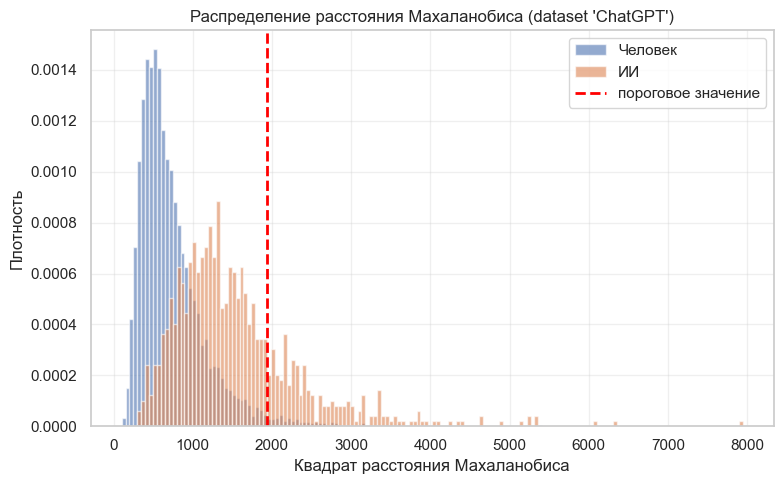

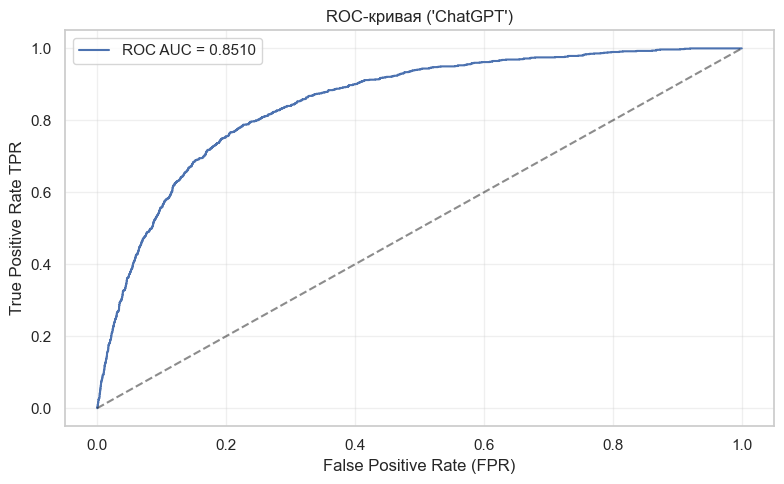

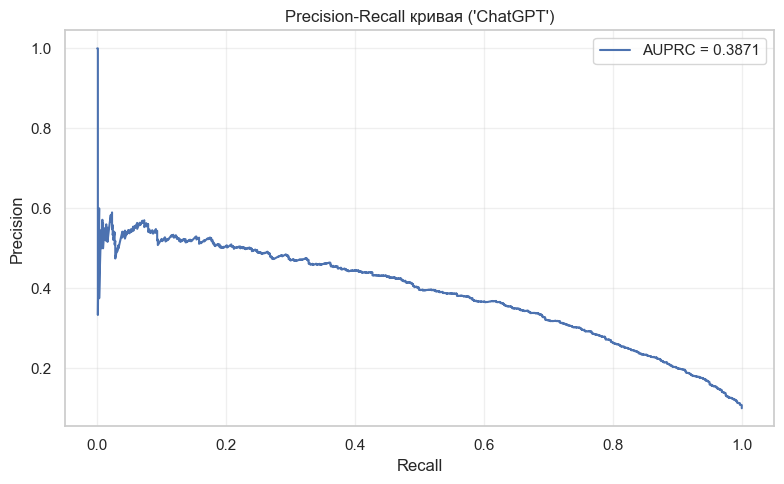

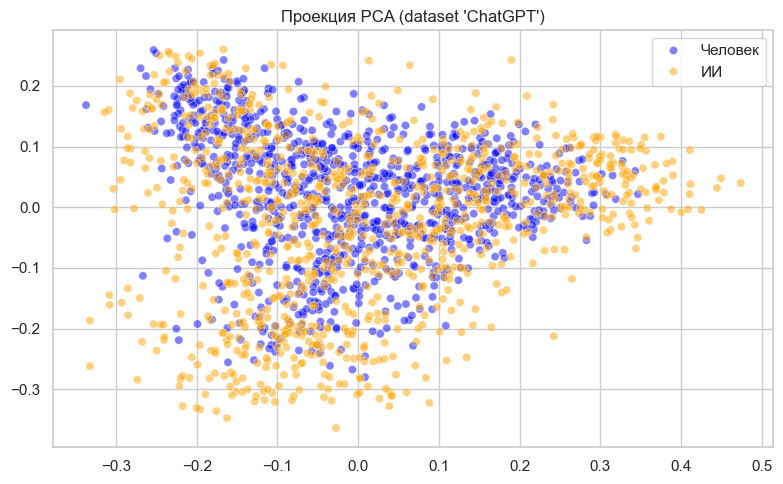


Эмбеддер: all-mpnet-base-v2
Доля синтетических текстов: 1.0%

Dataset: Mistral 7B
----------------------------------------
Количество объектов в 0 классе     : 9900
Количество объектов в 1 классе     : 100


100%|█████████████████████████████████████| 10000/10000 [26:12<00:00,  6.36it/s]


ROC-AUC                            : 0.8668
AUPRC                              : 0.0740
F1-score                           : 0.1154


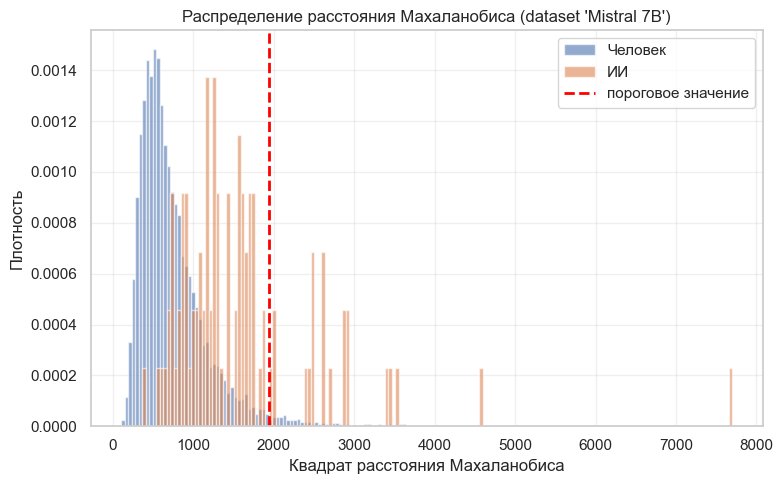

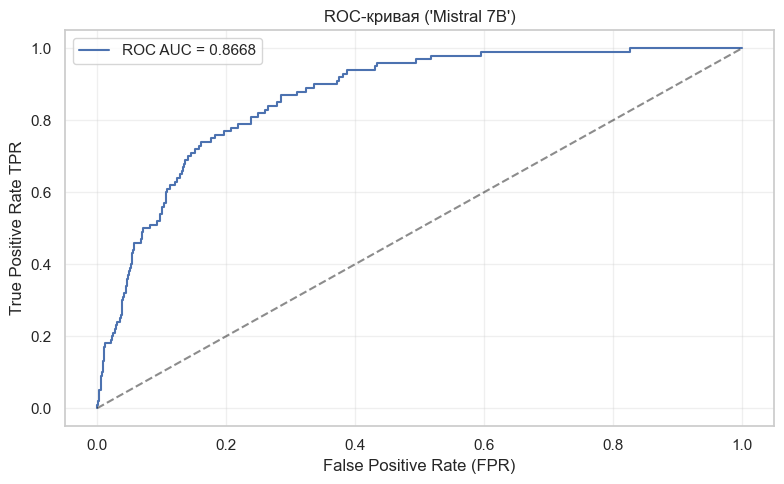

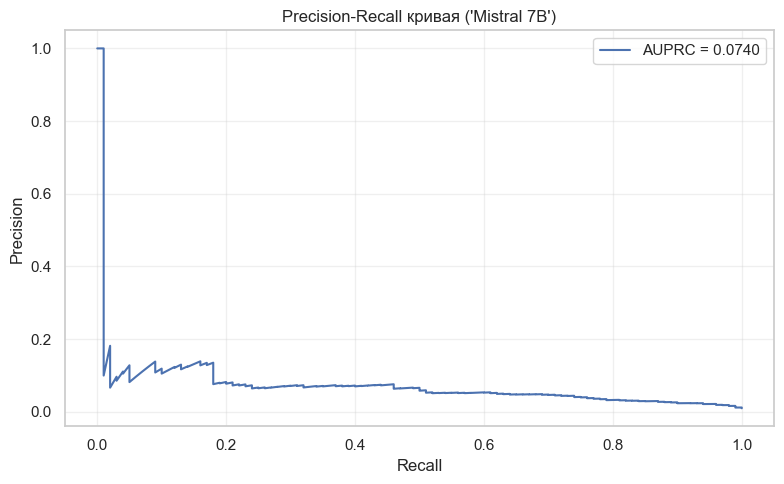

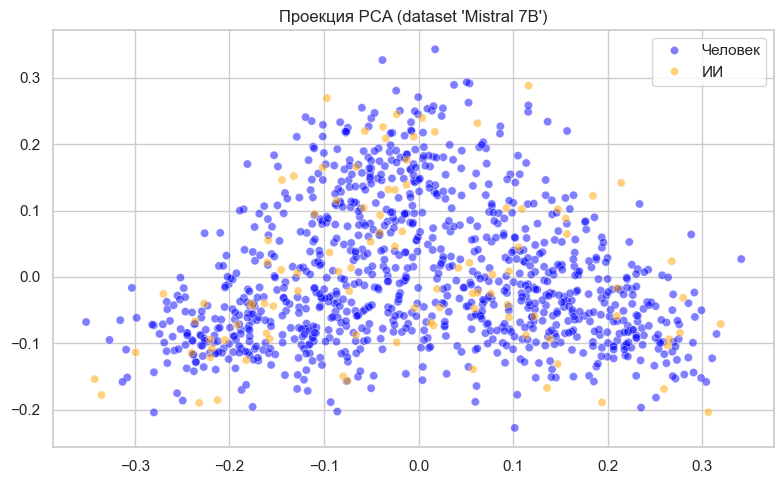


Dataset: Llama 3 13B
----------------------------------------
Количество объектов в 0 классе     : 9900
Количество объектов в 1 классе     : 100


100%|█████████████████████████████████████| 10000/10000 [26:01<00:00,  6.40it/s]


ROC-AUC                            : 0.8428
AUPRC                              : 0.0703
F1-score                           : 0.1257


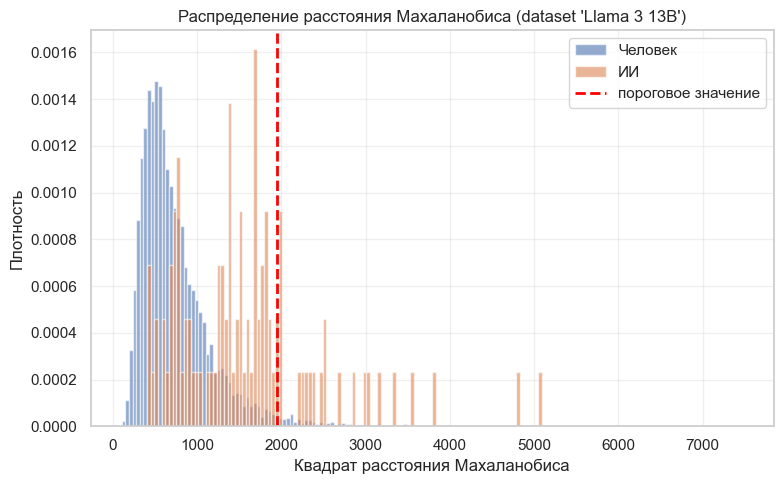

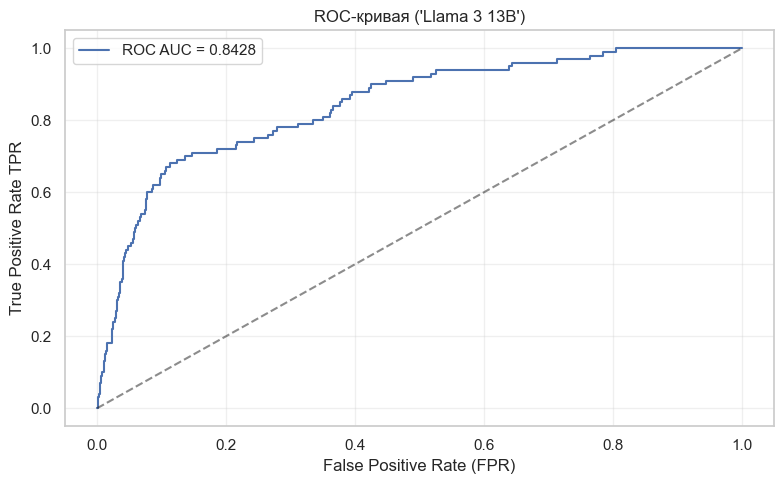

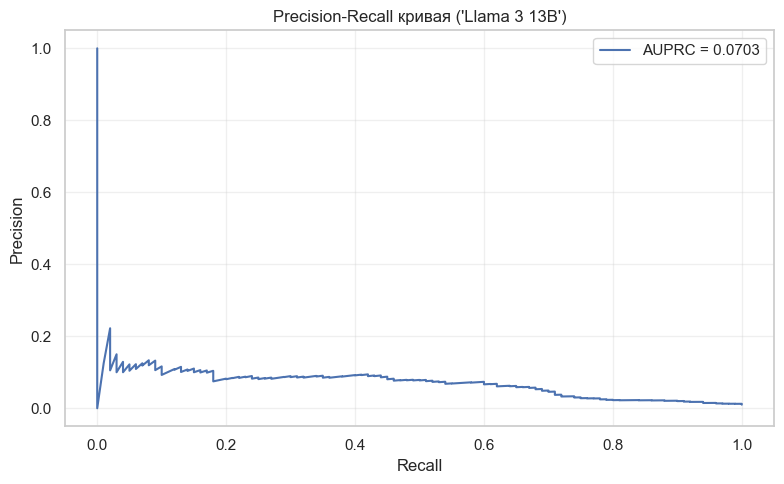

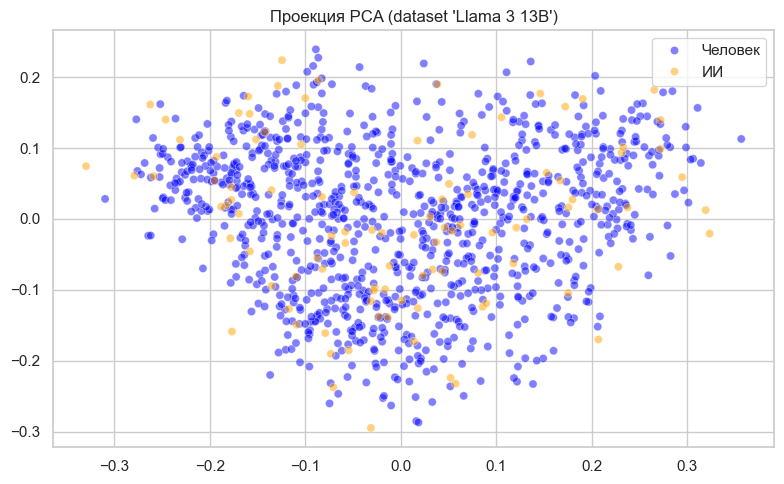


Dataset: DeepSeek V3.2
----------------------------------------
Количество объектов в 0 классе     : 9900
Количество объектов в 1 классе     : 100


100%|█████████████████████████████████████| 10000/10000 [26:27<00:00,  6.30it/s]


ROC-AUC                            : 0.8063
AUPRC                              : 0.0351
F1-score                           : 0.0676


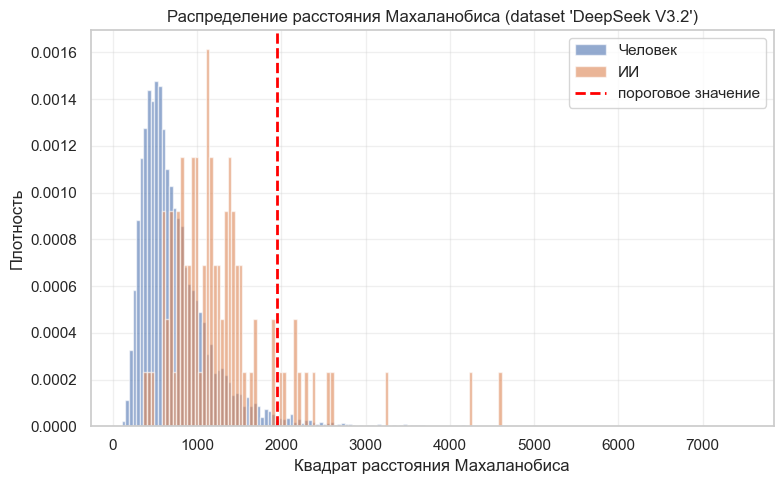

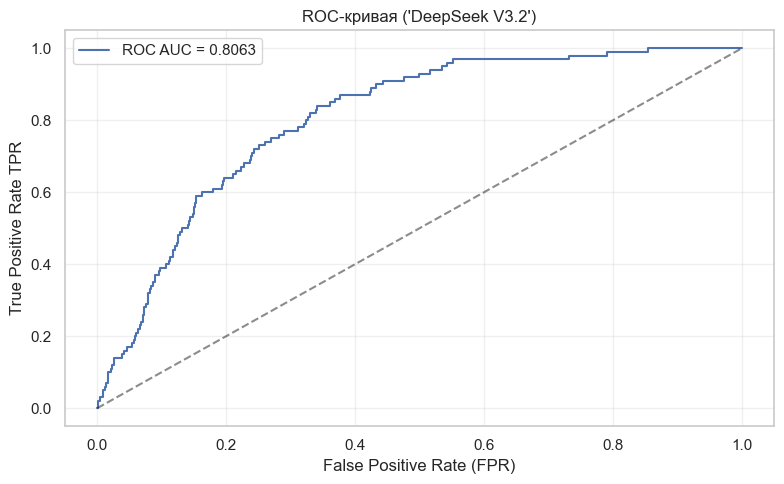

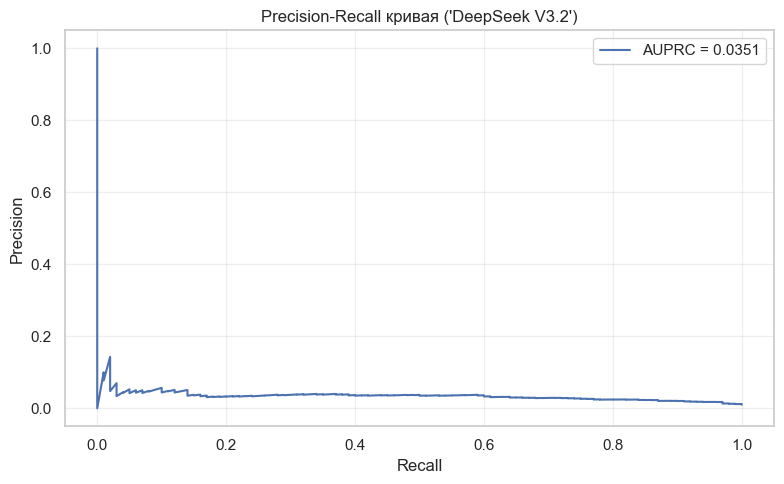

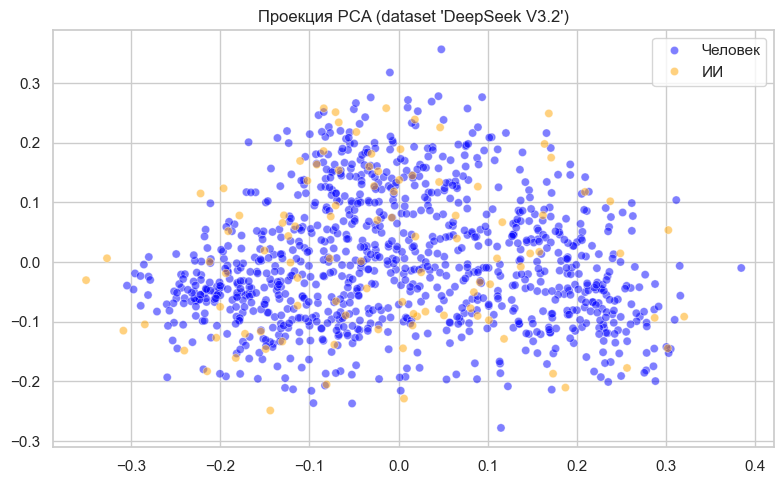


Dataset: ChatGPT
----------------------------------------
Количество объектов в 0 классе     : 9900
Количество объектов в 1 классе     : 100


100%|█████████████████████████████████████| 10000/10000 [26:16<00:00,  6.34it/s]


ROC-AUC                            : 0.8516
AUPRC                              : 0.0652
F1-score                           : 0.1308


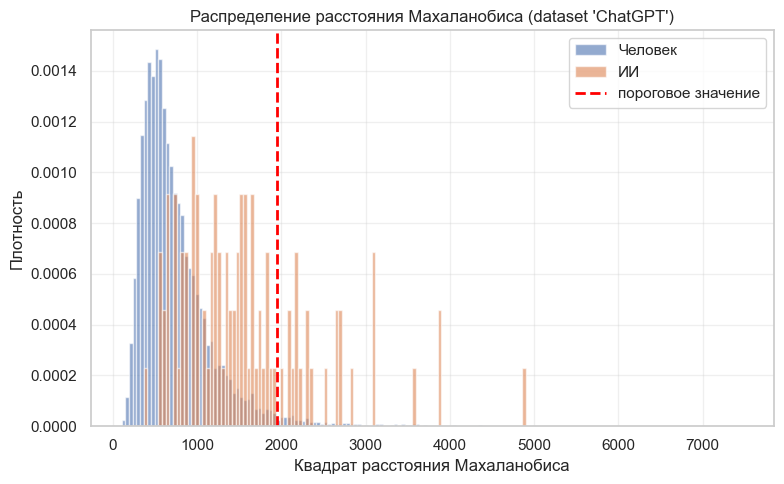

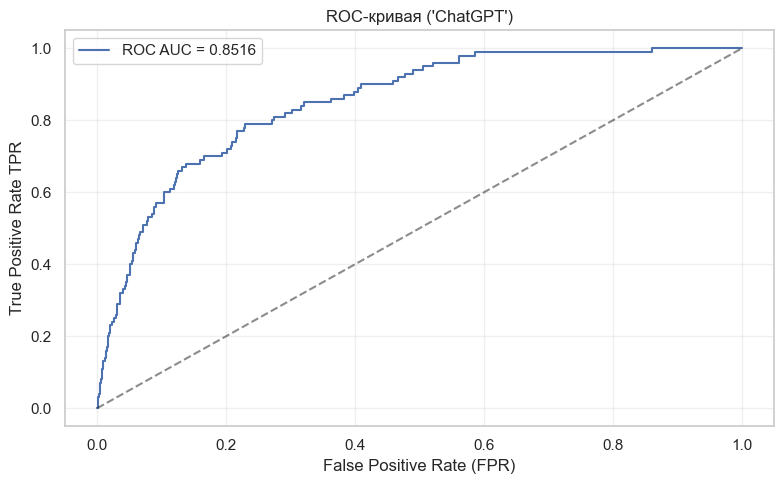

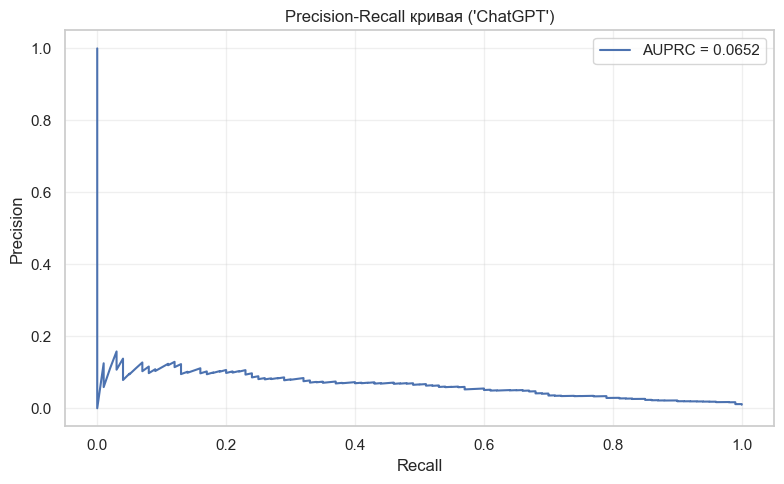

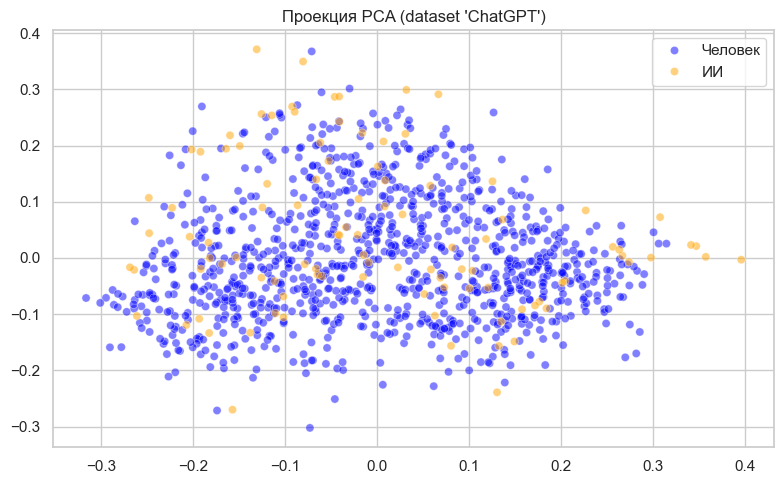

100%|█████████████████████████████████████| 10000/10000 [34:15<00:00,  4.87it/s]


Пороговое значение (q=0.99)        : 1698.7945

Эмбеддер: intfloat/e5-base
Доля синтетических текстов: 50.0%

Dataset: Mistral 7B
----------------------------------------
Количество объектов в 0 классе     : 5000
Количество объектов в 1 классе     : 5000


100%|█████████████████████████████████████| 10000/10000 [18:04<00:00,  9.22it/s]


ROC-AUC                            : 0.8533
AUPRC                              : 0.8396
F1-score                           : 0.4487


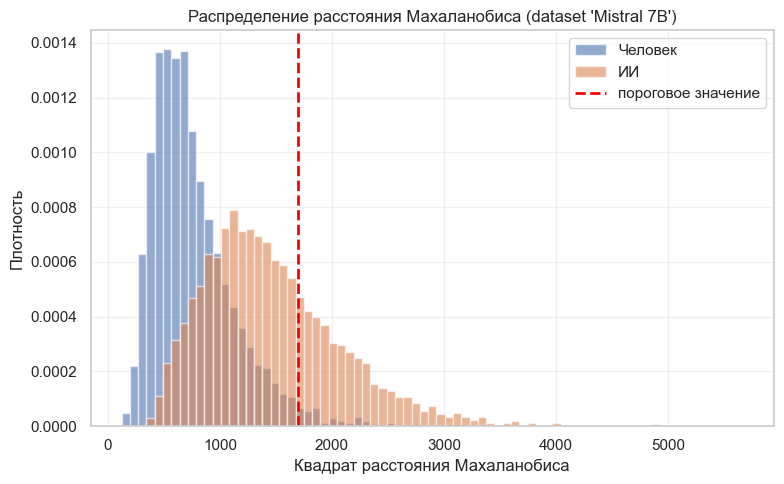

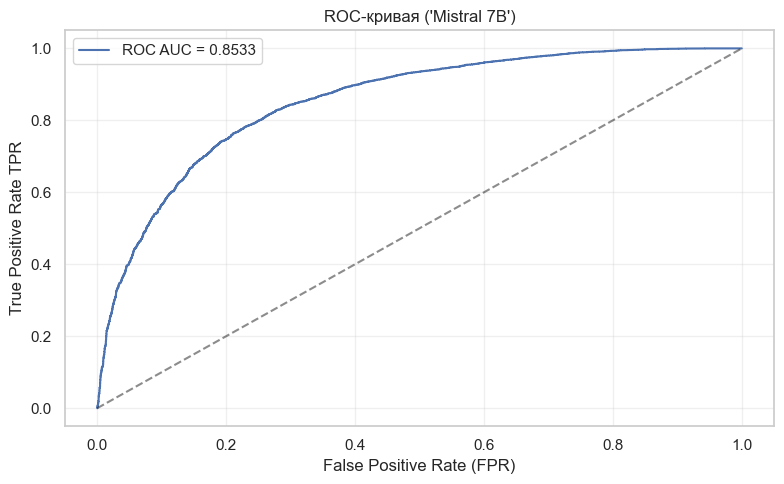

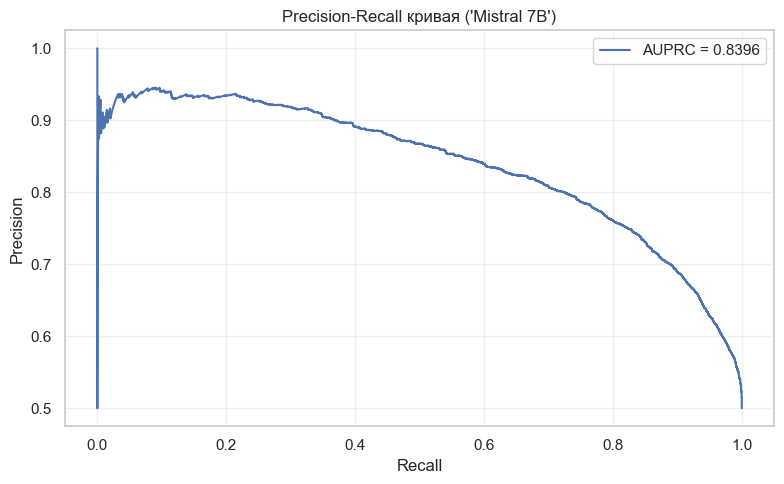

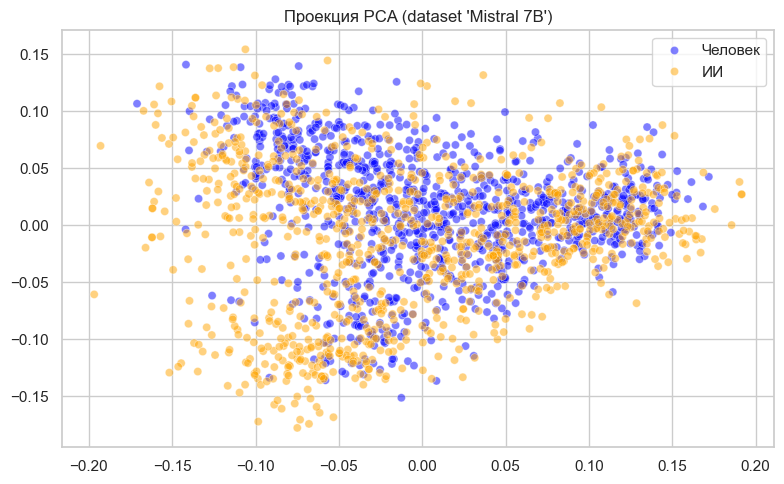


Dataset: Llama 3 13B
----------------------------------------
Количество объектов в 0 классе     : 5011
Количество объектов в 1 классе     : 4989


100%|█████████████████████████████████████| 10000/10000 [16:50<00:00,  9.90it/s]


ROC-AUC                            : 0.8706
AUPRC                              : 0.8700
F1-score                           : 0.5746


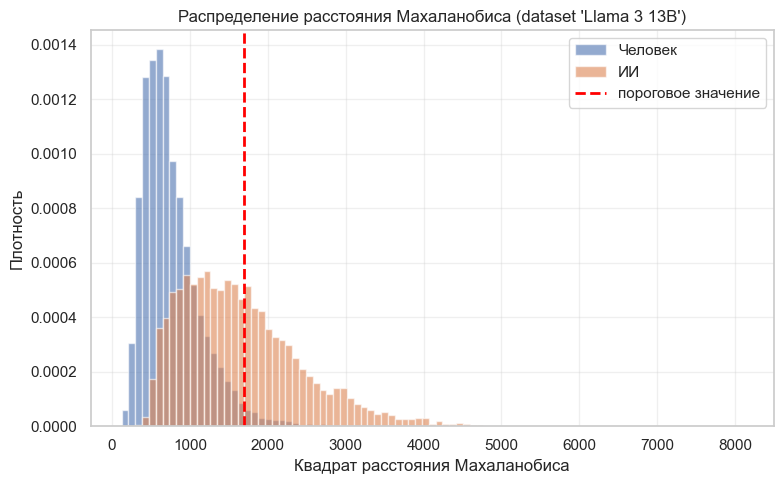

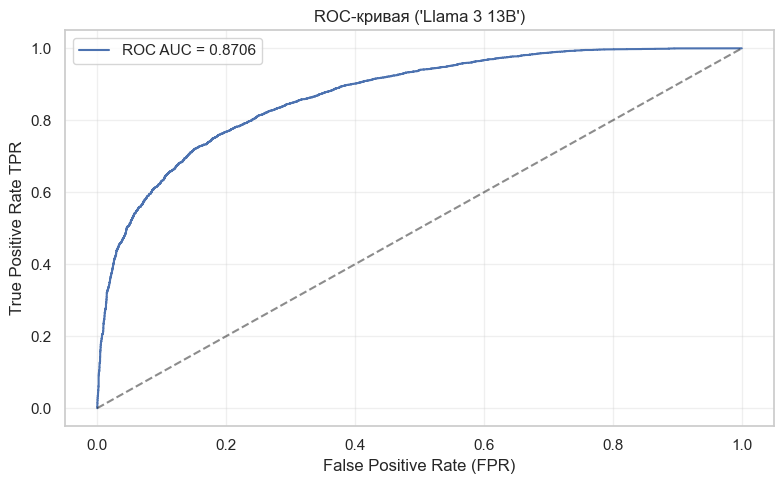

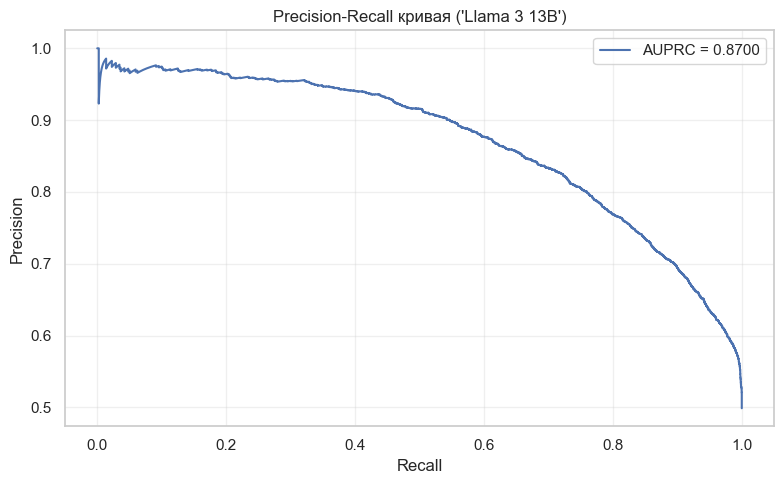

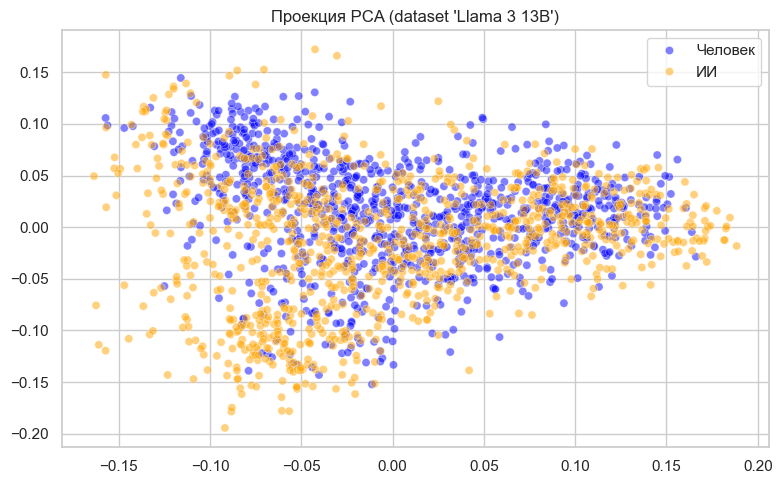


Dataset: DeepSeek V3.2
----------------------------------------
Количество объектов в 0 классе     : 5000
Количество объектов в 1 классе     : 5000


100%|█████████████████████████████████████| 10000/10000 [19:34<00:00,  8.51it/s]


ROC-AUC                            : 0.7801
AUPRC                              : 0.7433
F1-score                           : 0.2310


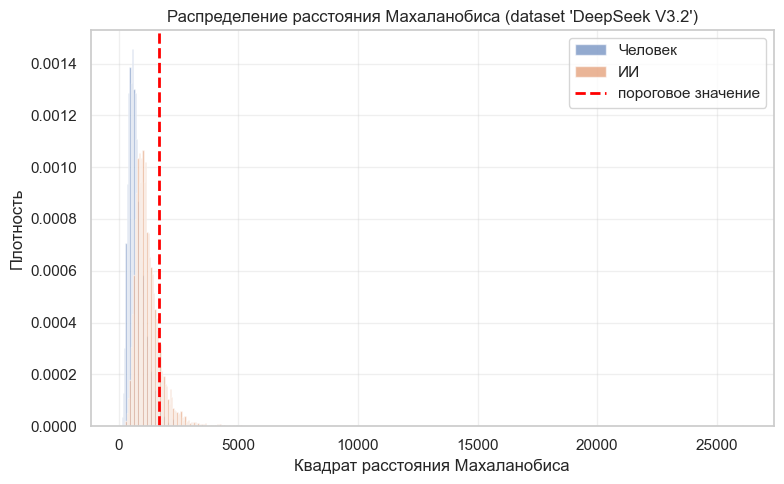

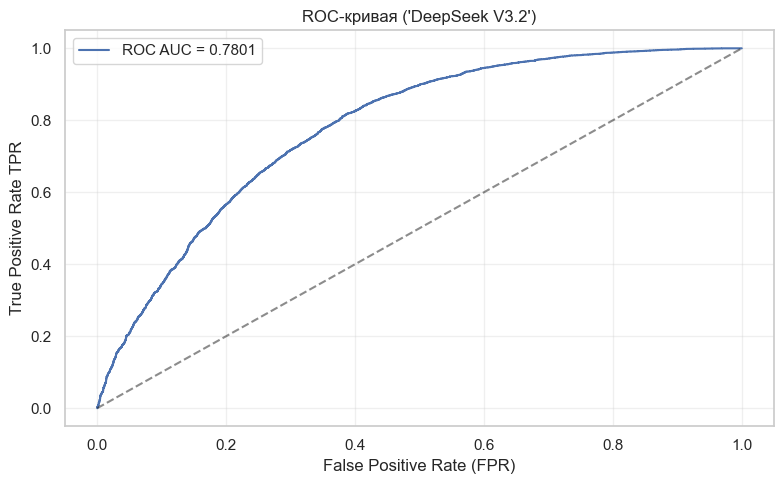

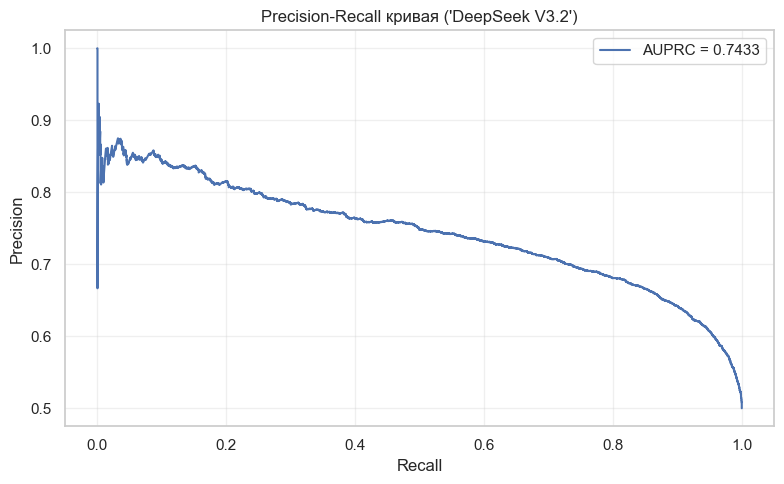

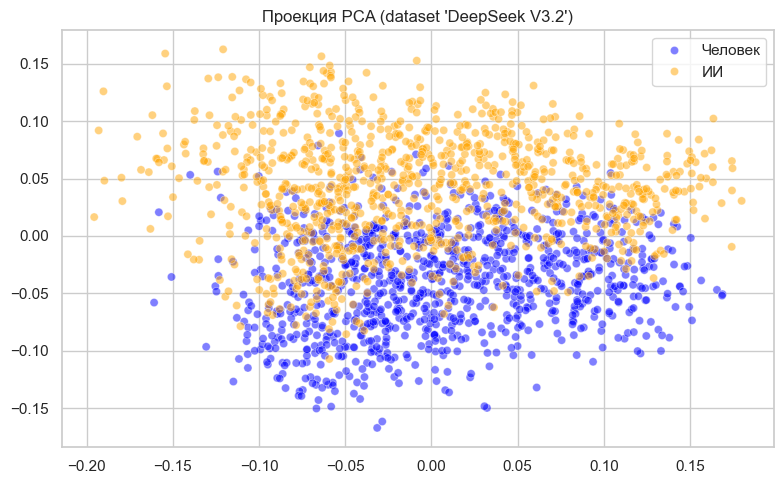


Dataset: ChatGPT
----------------------------------------
Количество объектов в 0 классе     : 5000
Количество объектов в 1 классе     : 5000


100%|█████████████████████████████████████| 10000/10000 [18:40<00:00,  8.93it/s]


ROC-AUC                            : 0.8352
AUPRC                              : 0.8262
F1-score                           : 0.4270


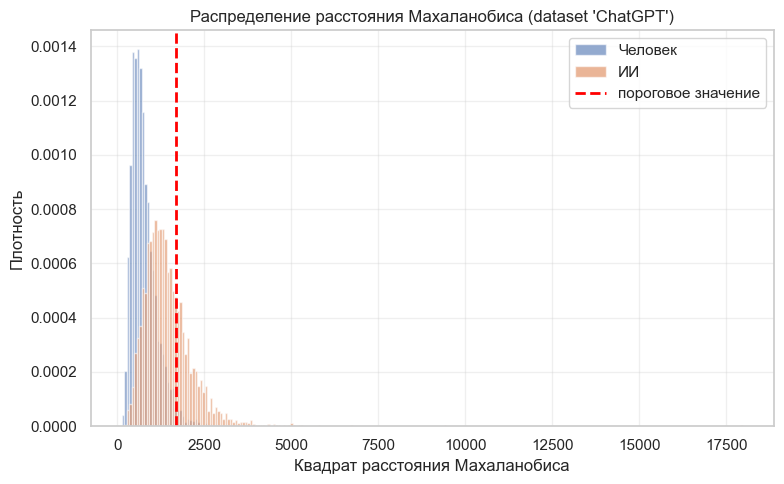

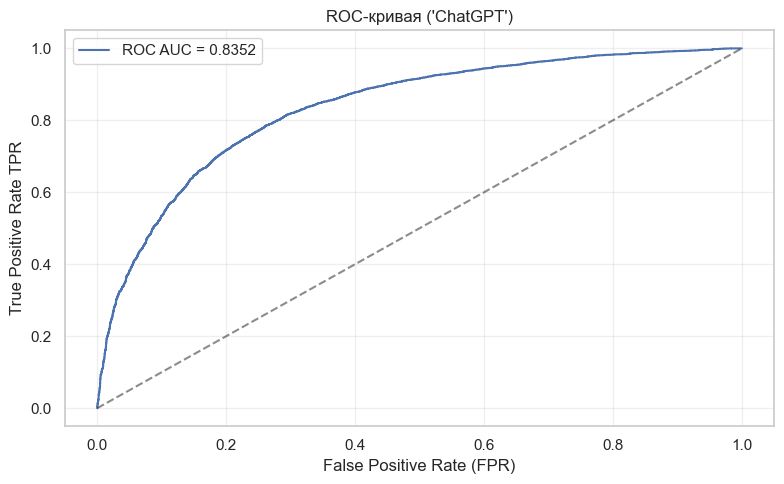

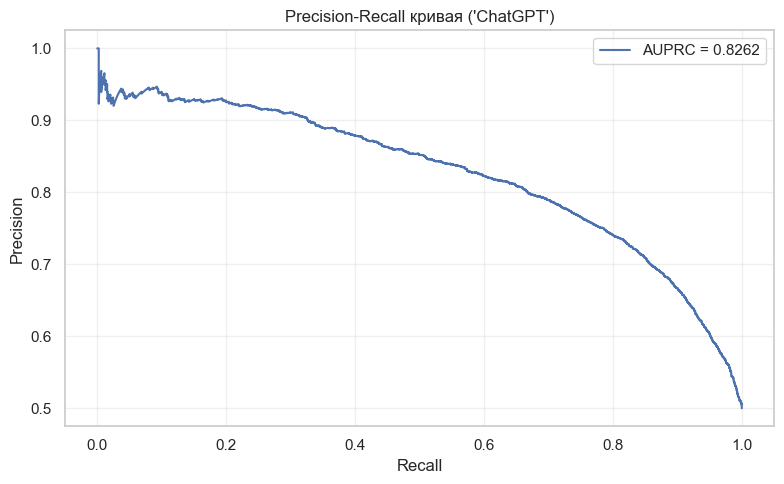

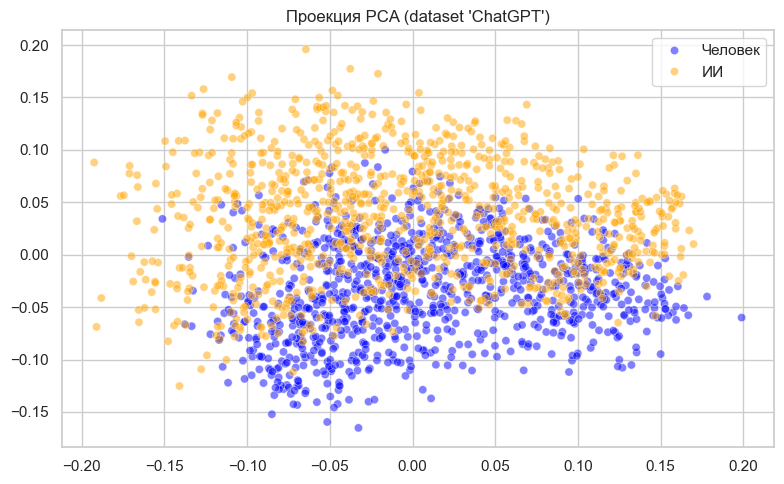


Эмбеддер: intfloat/e5-base
Доля синтетических текстов: 10.0%

Dataset: Mistral 7B
----------------------------------------
Количество объектов в 0 классе     : 9000
Количество объектов в 1 классе     : 1000


100%|█████████████████████████████████████| 10000/10000 [22:56<00:00,  7.27it/s]


ROC-AUC                            : 0.8656
AUPRC                              : 0.4393
F1-score                           : 0.4100


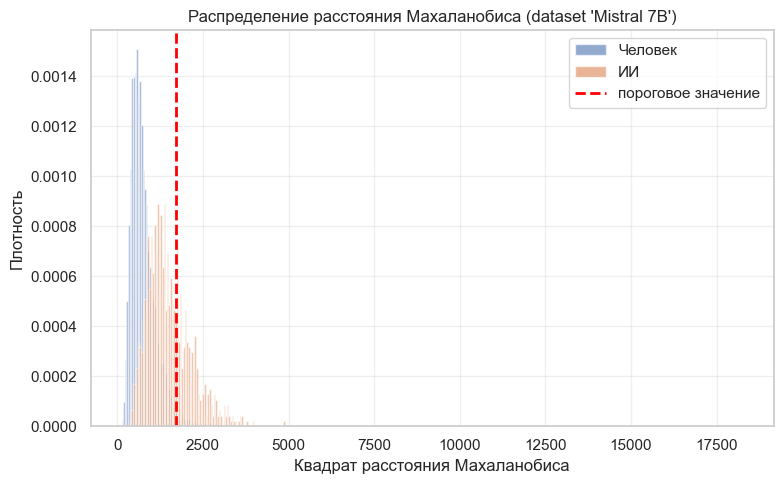

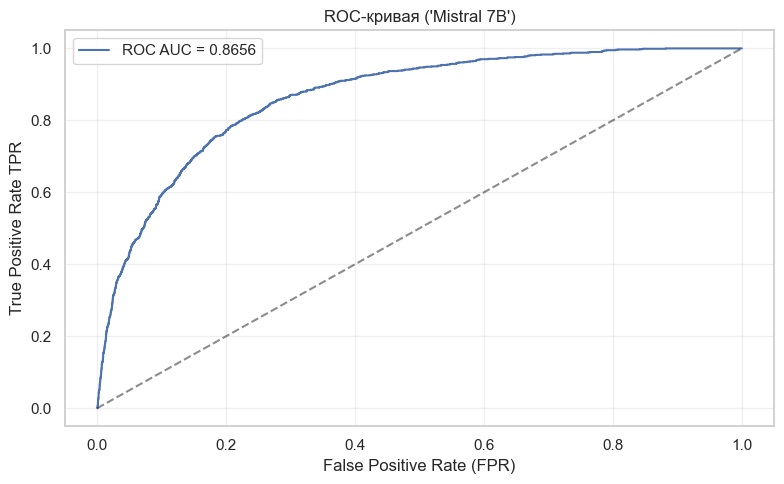

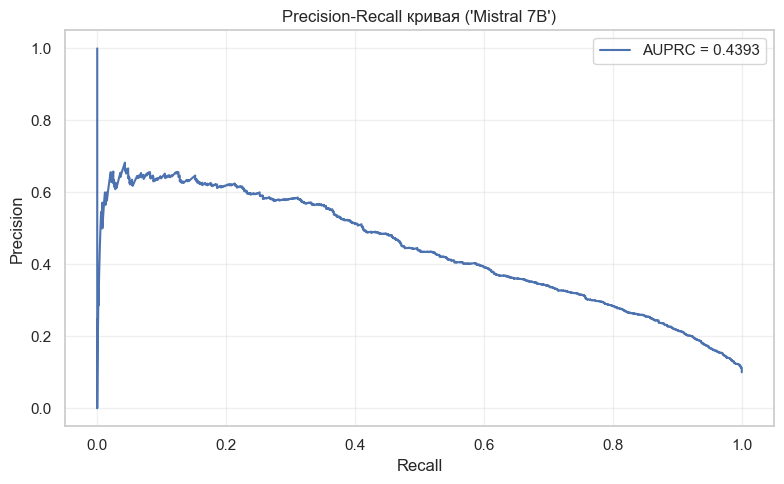

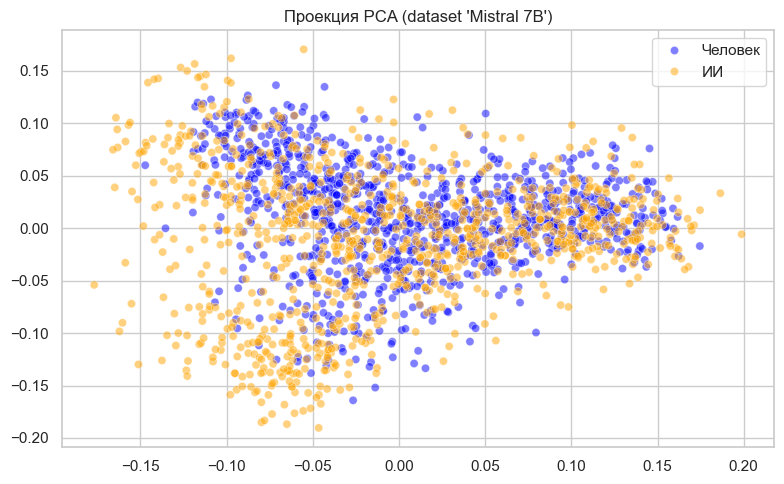


Dataset: Llama 3 13B
----------------------------------------
Количество объектов в 0 классе     : 9000
Количество объектов в 1 классе     : 1000


100%|█████████████████████████████████████| 10000/10000 [22:39<00:00,  7.35it/s]


ROC-AUC                            : 0.8701
AUPRC                              : 0.5058
F1-score                           : 0.4942


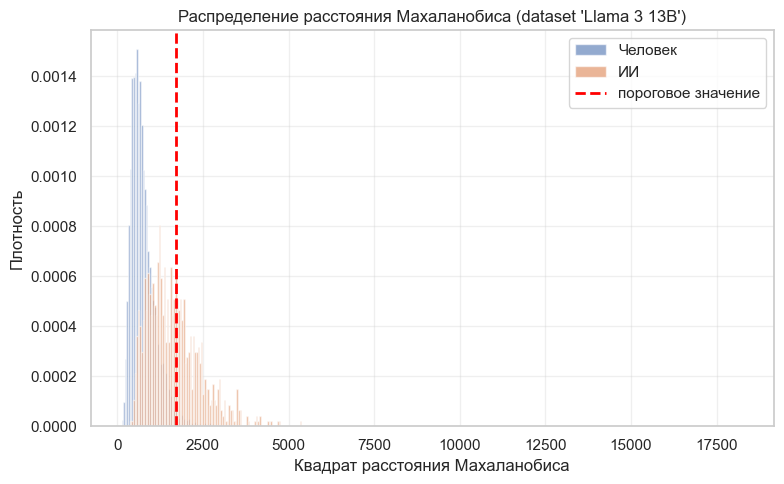

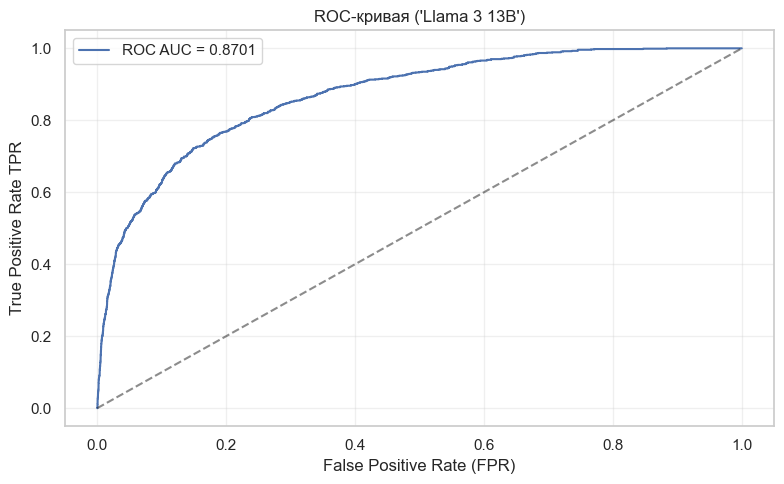

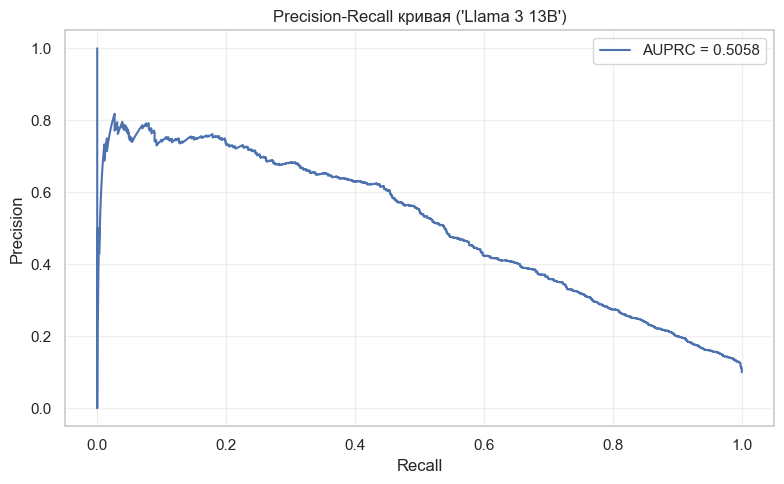

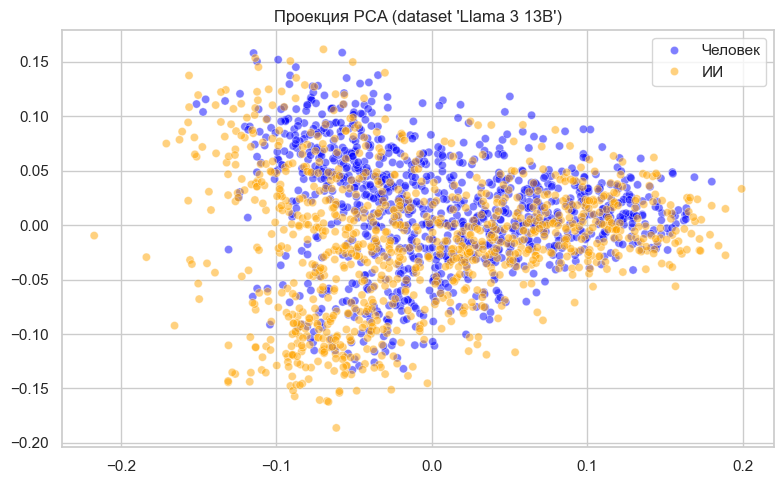


Dataset: DeepSeek V3.2
----------------------------------------
Количество объектов в 0 классе     : 9000
Количество объектов в 1 классе     : 1000


100%|█████████████████████████████████████| 10000/10000 [23:00<00:00,  7.24it/s]


ROC-AUC                            : 0.7799
AUPRC                              : 0.2530
F1-score                           : 0.1875


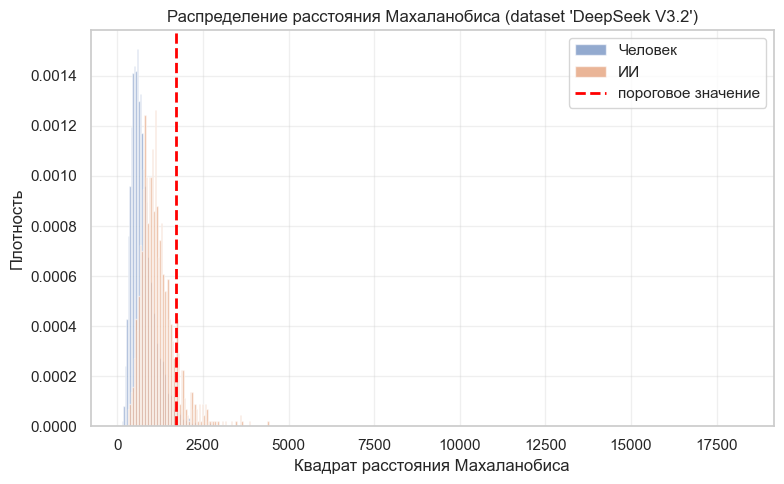

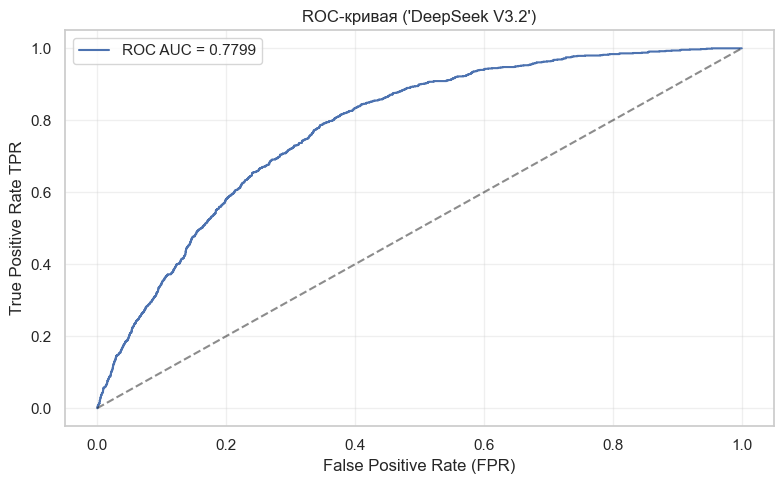

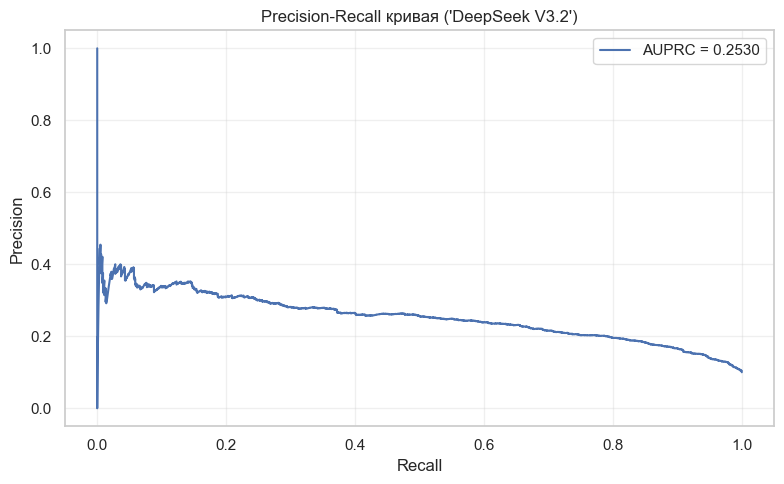

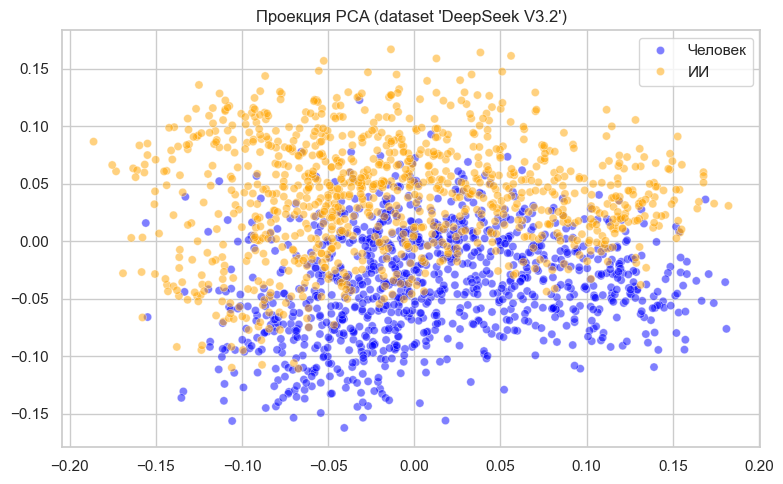


Dataset: ChatGPT
----------------------------------------
Количество объектов в 0 классе     : 9000
Количество объектов в 1 классе     : 1000


100%|█████████████████████████████████████| 10000/10000 [22:52<00:00,  7.29it/s]


ROC-AUC                            : 0.8399
AUPRC                              : 0.3956
F1-score                           : 0.3777


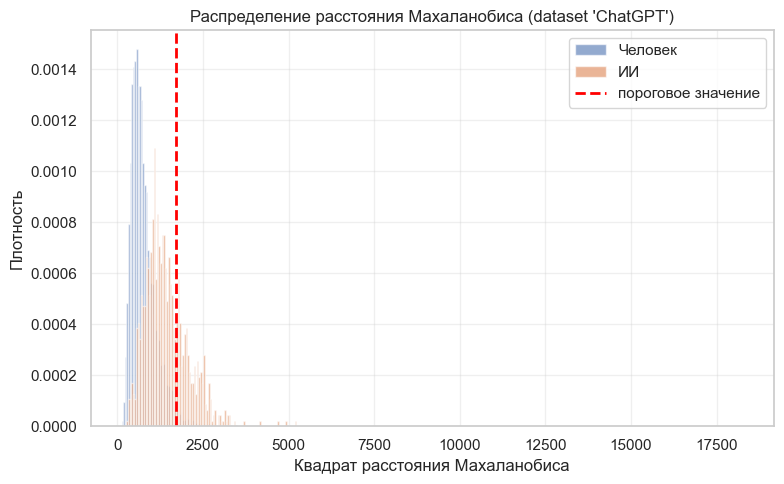

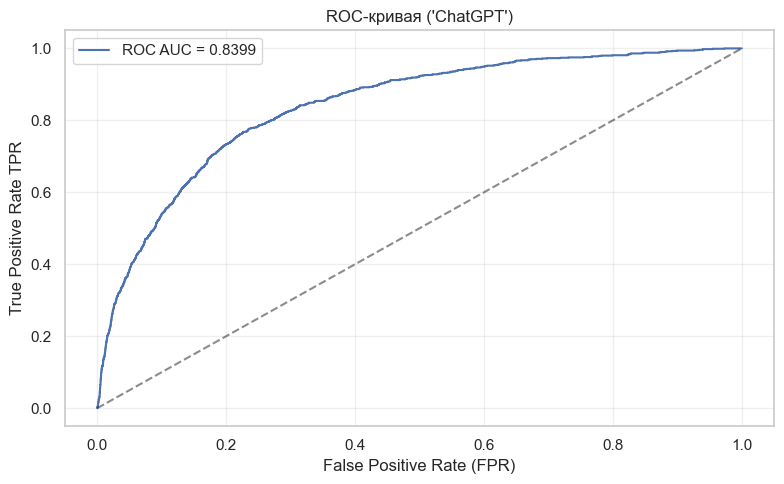

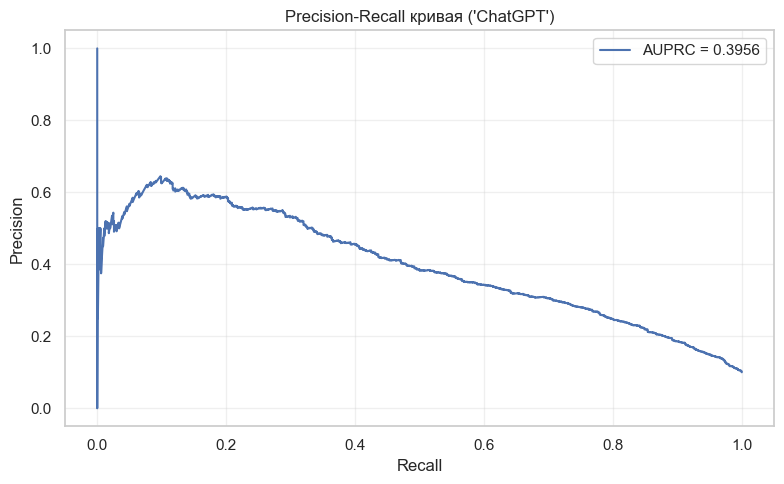

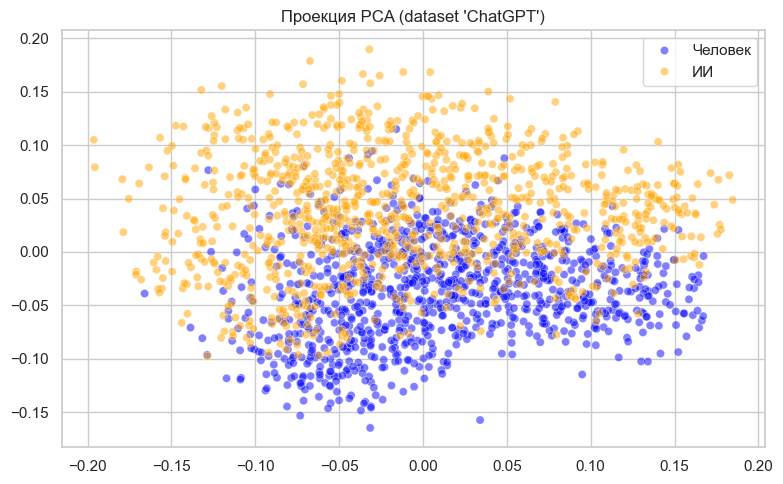


Эмбеддер: intfloat/e5-base
Доля синтетических текстов: 1.0%

Dataset: Mistral 7B
----------------------------------------
Количество объектов в 0 классе     : 9900
Количество объектов в 1 классе     : 100


100%|█████████████████████████████████████| 10000/10000 [23:47<00:00,  7.01it/s]


ROC-AUC                            : 0.8699
AUPRC                              : 0.0837
F1-score                           : 0.1778


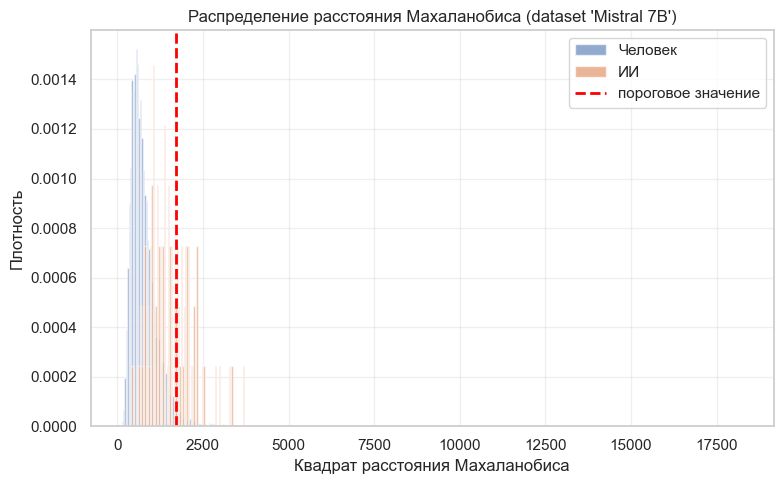

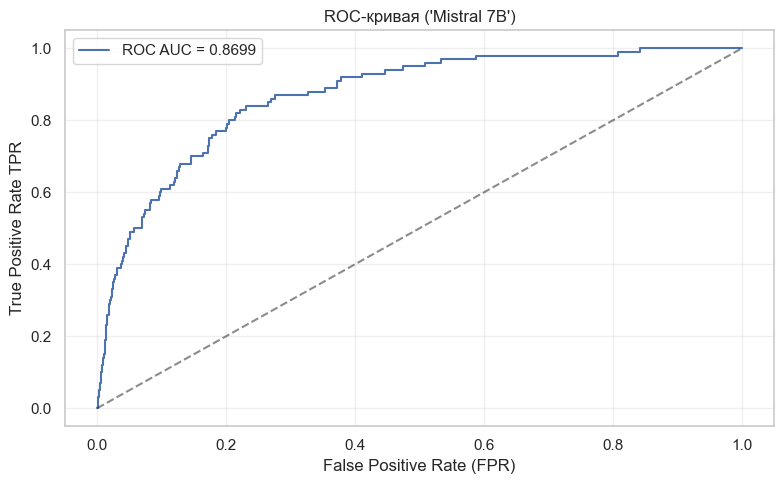

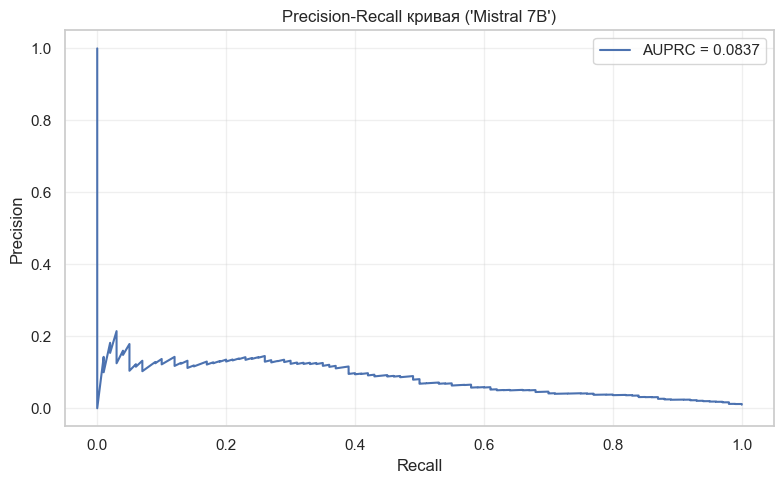

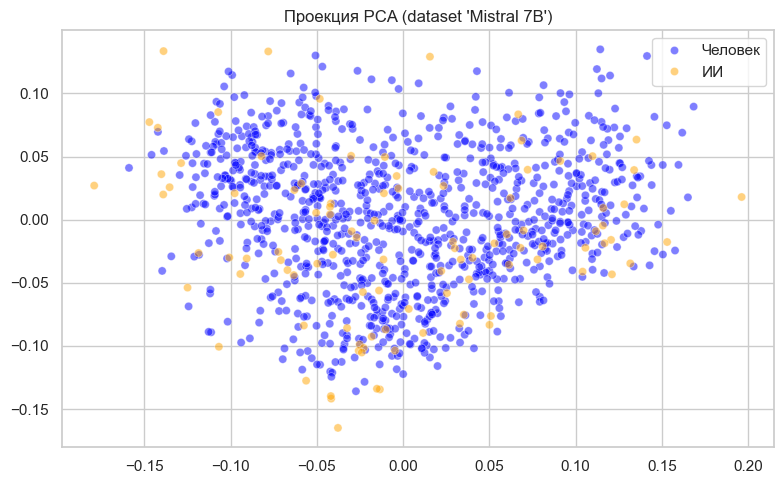


Dataset: Llama 3 13B
----------------------------------------
Количество объектов в 0 классе     : 9900
Количество объектов в 1 классе     : 100


100%|█████████████████████████████████████| 10000/10000 [23:48<00:00,  7.00it/s]


ROC-AUC                            : 0.8586
AUPRC                              : 0.1054
F1-score                           : 0.1956


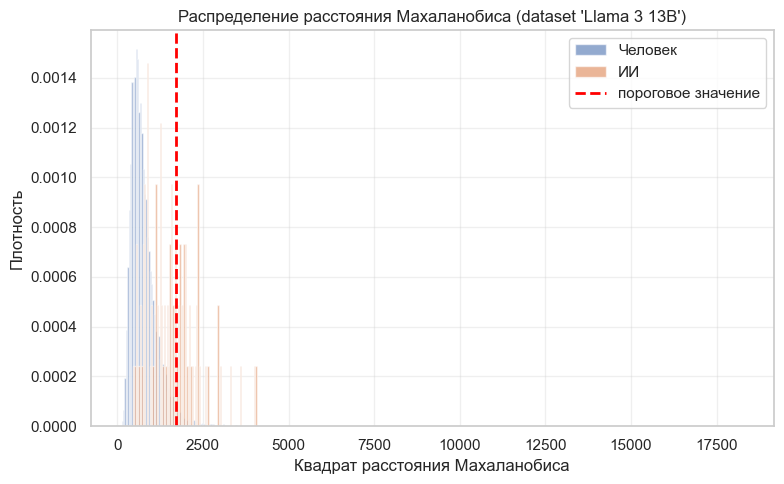

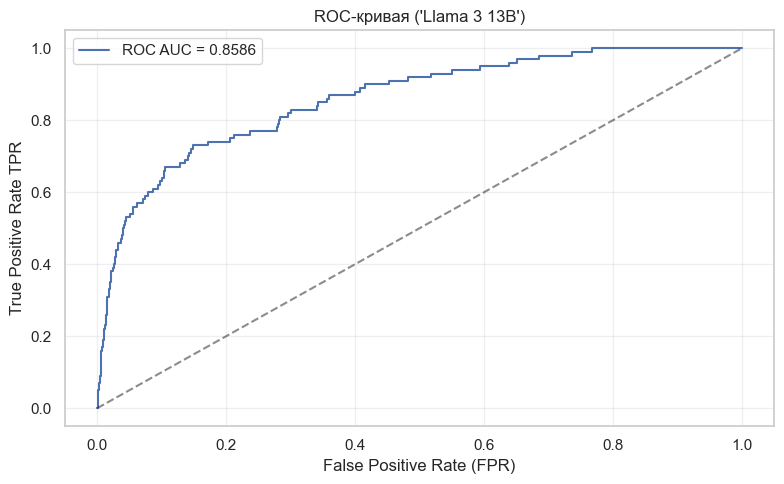

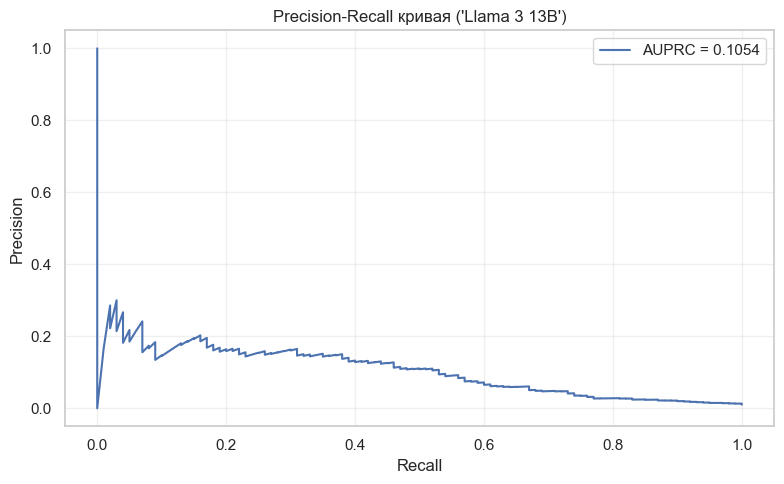

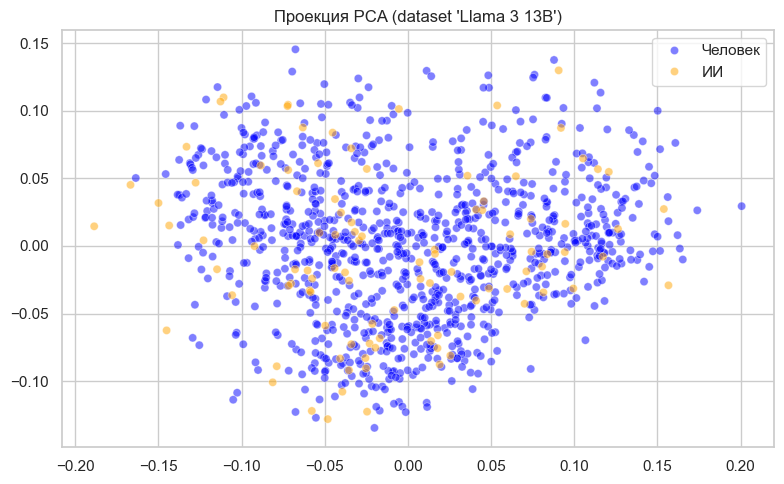


Dataset: DeepSeek V3.2
----------------------------------------
Количество объектов в 0 классе     : 9900
Количество объектов в 1 классе     : 100


100%|█████████████████████████████████████| 10000/10000 [23:42<00:00,  7.03it/s]


ROC-AUC                            : 0.7962
AUPRC                              : 0.0383
F1-score                           : 0.0930


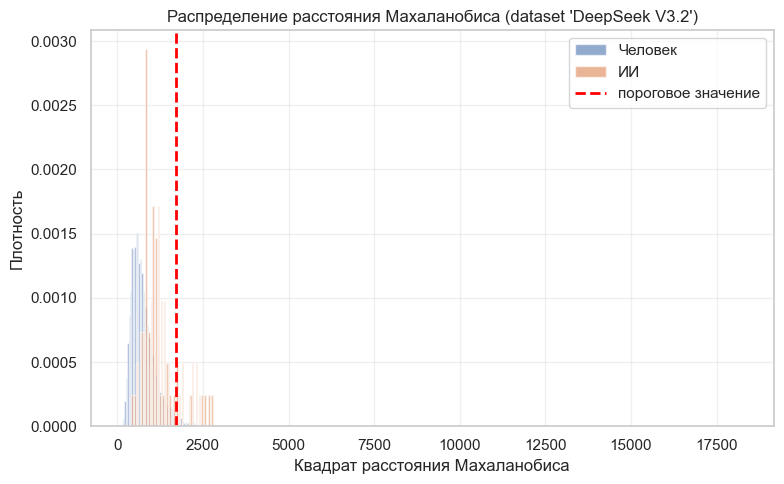

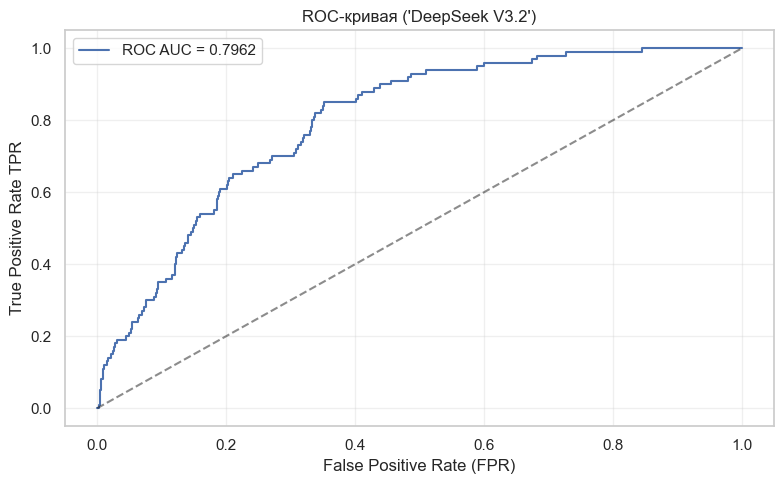

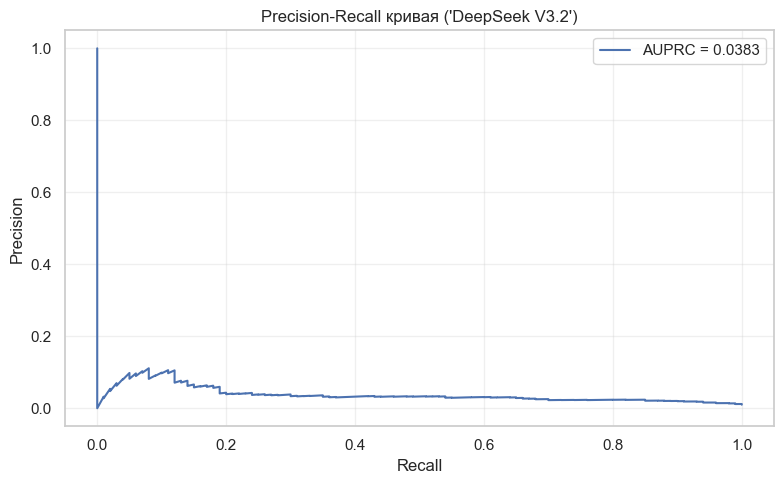

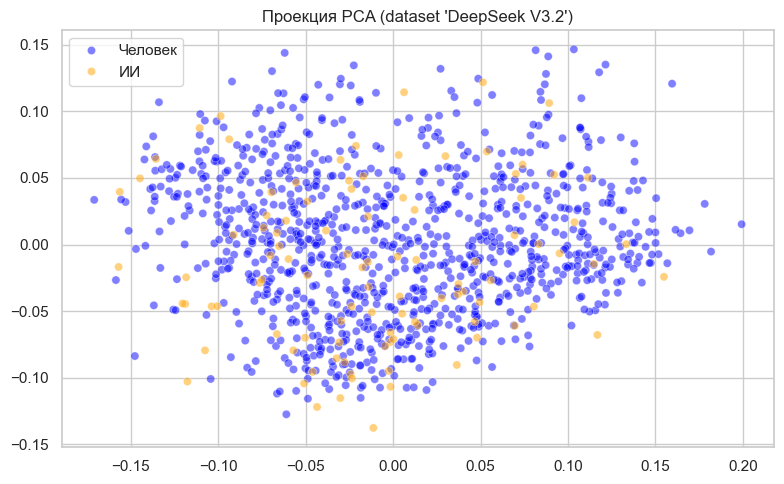


Dataset: ChatGPT
----------------------------------------
Количество объектов в 0 классе     : 9900
Количество объектов в 1 классе     : 100


100%|█████████████████████████████████████| 10000/10000 [23:46<00:00,  7.01it/s]


ROC-AUC                            : 0.8403
AUPRC                              : 0.0622
F1-score                           : 0.1411


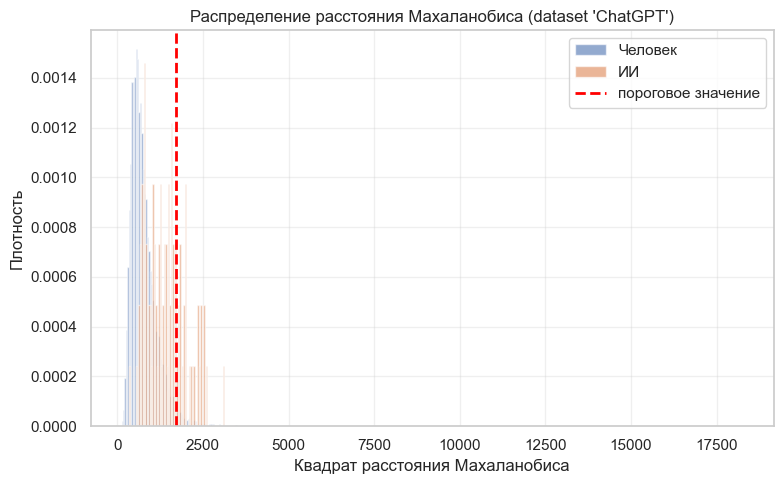

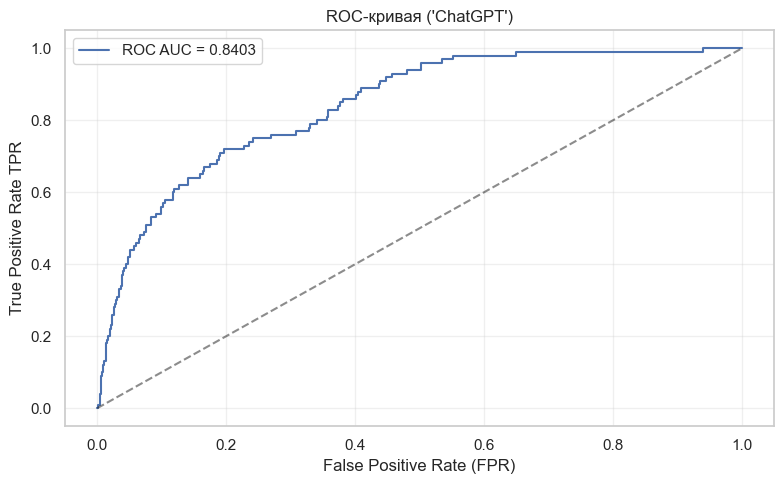

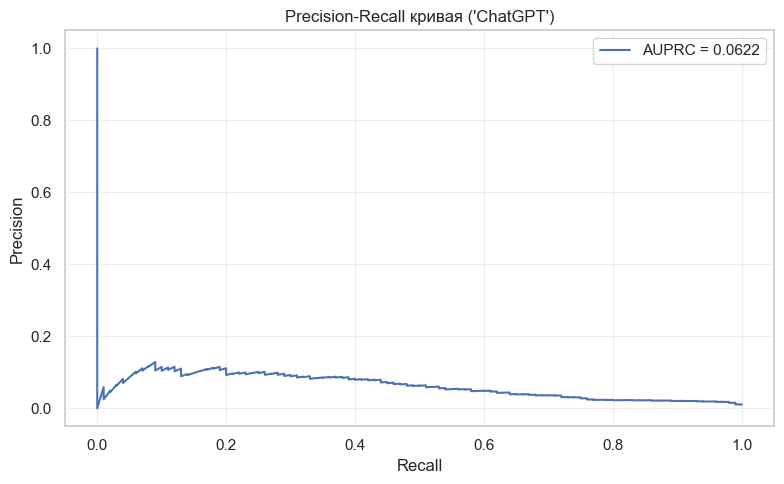

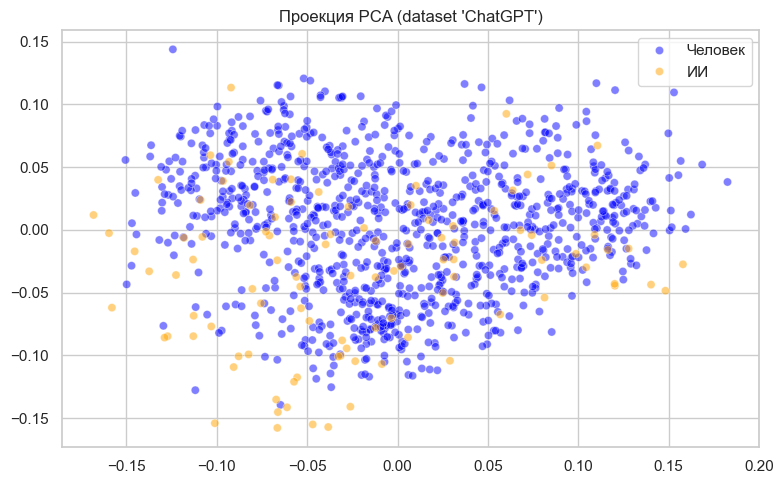

In [7]:
results = []

train_data, test_data = train_test_split(
    human_df, 
    train_size=MAX_SAMPLES, 
    test_size=MAX_SAMPLES, 
    shuffle=True, 
    random_state=SEED
)

for encoder_name in ENCODERS:
    encoder_model = SentenceTransformer(encoder_name, device="mps")
    X_human_train = get_embeddings(encoder_model, train_data["text"])

    cov_estimator = LedoitWolf().fit(X_human_train)
    human_train_scores = cov_estimator.mahalanobis(X_human_train)
        
    threshold = np.quantile(human_train_scores, QUANTILE)
    print_kv(f"Пороговое значение (q={QUANTILE})", f"{threshold:.4f}")
    
    for ai_ratio in AI_RATIOS:
        print_header(f"Эмбеддер: {encoder_name}\nДоля синтетических текстов: {ai_ratio * 100}%")

        for dataset_name, ai_dataset in ai_datasets.items():
            print(f"\nDataset: {dataset_name}")
            print("-" * 40)

            X_ai_test, X_human_test = make_test_dataset(
                ai_dataset, test_data, ai_ratio, MAX_SAMPLES, SEED
            )
            X_ai_test = X_ai_test['text']
            X_human_test = X_human_test['text']
            
            print_kv("Количество объектов в 0 классе", len(X_human_test))
            print_kv("Количество объектов в 1 классе", len(X_ai_test))

            X_test_combined = np.concatenate([X_human_test, X_ai_test])
            X_test_embeddings = get_embeddings(encoder_model, X_test_combined)
            X_human_test_embeddings = X_test_embeddings[:len(X_human_test)]
            X_ai_test_embeddings = X_test_embeddings[len(X_human_test):]
    
            y_test = np.concatenate([
                np.zeros(len(X_human_test), dtype=int),
                np.ones(len(X_ai_test), dtype=int)
            ])
    
            test_scores = cov_estimator.mahalanobis(X_test_embeddings)
            human_scores = test_scores[:len(X_human_test)]
            ai_scores = test_scores[len(X_human_test):]
    
            roc_auc = roc_auc_score(y_test, test_scores)
            auprc = average_precision_score(y_test, test_scores)
            y_pred = (test_scores > threshold).astype(int)
            f1 = f1_score(y_test, y_pred)
            
            print_kv("ROC-AUC", f"{roc_auc:.4f}")
            print_kv("AUPRC", f"{auprc:.4f}")
            print_kv("F1-score", f"{f1:.4f}")
    
            plot_mahalanobis_distributions(human_scores, ai_scores, threshold, dataset_name)
            plot_roc_curve(y_test, test_scores, roc_auc, dataset_name)
            plot_pr_curve(y_test, test_scores, auprc, dataset_name)
            plot_pca_projection(X_human_test_embeddings, X_ai_test_embeddings, dataset_name)
    
            results.append({
                "encoder": encoder_name,
                "dataset": dataset_name,
                "size": len(X_test_combined),
                "n_human": len(X_human_test),
                "n_ai": len(X_ai_test),
                "roc_auc": roc_auc,
                "auprc": auprc,
                "f1": f1
            })


In [8]:
results_df = pd.DataFrame(results)
print(results_df)

              encoder        dataset   size  n_human  n_ai   roc_auc  \
0    all-MiniLM-L6-v2     Mistral 7B  10000     5000  5000  0.828152   
1    all-MiniLM-L6-v2    Llama 3 13B  10000     5011  4989  0.839149   
2    all-MiniLM-L6-v2  DeepSeek V3.2  10000     5000  5000  0.753246   
3    all-MiniLM-L6-v2        ChatGPT  10000     5000  5000  0.830797   
4    all-MiniLM-L6-v2     Mistral 7B  10000     9000  1000  0.843117   
5    all-MiniLM-L6-v2    Llama 3 13B  10000     9000  1000  0.840473   
6    all-MiniLM-L6-v2  DeepSeek V3.2  10000     9000  1000  0.753738   
7    all-MiniLM-L6-v2        ChatGPT  10000     9000  1000  0.834791   
8    all-MiniLM-L6-v2     Mistral 7B  10000     9900   100  0.855251   
9    all-MiniLM-L6-v2    Llama 3 13B  10000     9900   100  0.840935   
10   all-MiniLM-L6-v2  DeepSeek V3.2  10000     9900   100  0.773627   
11   all-MiniLM-L6-v2        ChatGPT  10000     9900   100  0.838507   
12  all-mpnet-base-v2     Mistral 7B  10000     5000  5000  0.83